**Main imports**

In [1]:

!pip install -q -U einops datasets matplotlib tqdm

import math
import random
import copy
from pathlib import Path
from inspect import isfunction
from functools import partial
from copy import deepcopy

import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch import einsum
from torch.optim import Adam
from torch.utils.data import DataLoader

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from tqdm.auto import tqdm

from einops import rearrange
import torchvision

from IPython import display as disp

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.6/44.6 kB 1.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 507.1/507.1 kB 19.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 83.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 14.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 19.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 19.3 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
lida 0.0.10 requires fastapi, which is not installed.
lida 0.0.10 requires kaleido, which is not installed.
lida 0.0.10 requires python-multipart, which is not installed.
lida 0.0.10 requires uvicorn, which is not installed.


**Batch Size**

In [2]:
BATCH_SIZE = 512

In [3]:
LEARNING_RATE=0.001

In [4]:
DIFFUSION_TIME_STEPS = 1000

In [5]:
WEIGHT_DECAY = 0

**Load Data** \
<u>NOTE:</u> Images are normalised


In [7]:
# helper function to make getting another batch of data easier
def cycle(iterable):
    while True:
        for x in iterable:
            yield x

class_names = ['apple','aquarium_fish','baby','bear','beaver','bed','bee','beetle','bicycle','bottle','bowl','boy','bridge','bus','butterfly','camel','can','castle','caterpillar','cattle','chair','chimpanzee','clock','cloud','cockroach','couch','crab','crocodile','cup','dinosaur','dolphin','elephant','flatfish','forest','fox','girl','hamster','house','kangaroo','computer_keyboard','lamp','lawn_mower','leopard','lion','lizard','lobster','man','maple_tree','motorcycle','mountain','mouse','mushroom','oak_tree','orange','orchid','otter','palm_tree','pear','pickup_truck','pine_tree','plain','plate','poppy','porcupine','possum','rabbit','raccoon','ray','road','rocket','rose','sea','seal','shark','shrew','skunk','skyscraper','snail','snake','spider','squirrel','streetcar','sunflower','sweet_pepper','table','tank','telephone','television','tiger','tractor','train','trout','tulip','turtle','wardrobe','whale','willow_tree','wolf','woman','worm',]

train_loader = DataLoader(
    torchvision.datasets.CIFAR100('data', train=True, download=True, transform=torchvision.transforms.Compose([
        torchvision.transforms.ToTensor(),
        torchvision.transforms.Normalize([0.5], [0.5]),
    ])),
    batch_size=BATCH_SIZE,
    drop_last=True,
    num_workers=4  # Number of workers
)


test_loader = torch.utils.data.DataLoader(
    torchvision.datasets.CIFAR100('data', train=False, download=True, transform=torchvision.transforms.Compose([
        torchvision.transforms.ToTensor()
    ])),
    batch_size=BATCH_SIZE, drop_last=True)

train_iterator = iter(cycle(train_loader))
test_iterator = iter(cycle(test_loader))

print(f'> Size of training dataset {len(train_loader.dataset)}')
print(f'> Size of test dataset {len(test_loader.dataset)}')

100%|██████████| 169001437/169001437 [00:13<00:00, 12882254.79it/s]


Extracting data/cifar-100-python.tar.gz to data
Files already downloaded and verified
> Size of training dataset 50000
> Size of test dataset 10000


**View some of the test dataset** \
(Without Normalisation)

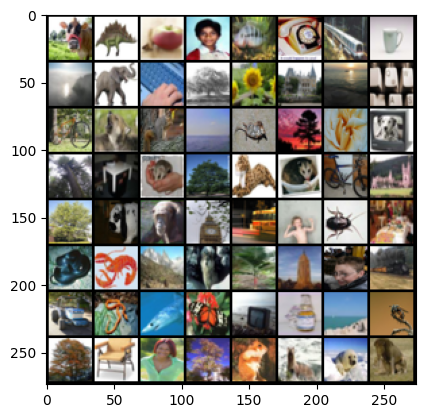

In [8]:
plt.rcParams['figure.dpi'] = 100
x, t = next(train_iterator)
x, t = x.to(device), t.to(device)

# Select the first 64 images for an 8x8 grid
x_subset = x[:64]

# Normalize the images
x_show = x_subset - x_subset.min()  # Translate so the minimum value is 0.
x_show = x_show / x_show.max()  # Scale so the maximum value is 1.

# Create an 8x8 grid of images
grid_img = torchvision.utils.make_grid(x_show, nrow=8)

# Display the grid
plt.imshow(grid_img.cpu().numpy().transpose(1, 2, 0), cmap=plt.cm.binary)
plt.show()




**Code References** \
Python implementation of standard Unet / Denoising Diffusion Probabilistic Models (DDPM): https://huggingface.co/blog/annotated-diffusion

Video that helped me implement CFG & EMA: https://www.youtube.com/watch?v=TBCRlnwJtZU&t=1082s






**Utility Functions**

In [9]:
def exists(x):
    return x is not None

def default(val, d):
    if exists(val):
        return val
    return d() if isfunction(d) else d

class Residual(nn.Module):
    def __init__(self, fn):
        super().__init__()
        self.fn = fn

    def forward(self, x, *args, **kwargs):
        return self.fn(x, *args, **kwargs) + x

def Upsample(dim):
    return nn.ConvTranspose2d(dim, dim, 4, 2, 1)

def Downsample(dim):
    return nn.Conv2d(dim, dim, 4, 2, 1)

In [10]:
class SinusoidalPositionEmbeddings(nn.Module):
    'https://arxiv.org/abs/1706.03762'
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        return embeddings

In [11]:
class DepthwiseSeparableConv(nn.Module):
  'https://arxiv.org/abs/1704.04861'
  def __init__(self, in_channels, out_channels, kernel_size, stride=1, padding=0):
      super(DepthwiseSeparableConv, self).__init__()
      self.depthwise = nn.Conv2d(in_channels, in_channels, kernel_size=kernel_size,
                                  stride=stride, padding=padding, groups=in_channels)
      self.pointwise = nn.Conv2d(in_channels, out_channels, kernel_size=1)

  def forward(self, x):
      x = self.depthwise(x)
      x = self.pointwise(x)
      return x

**Conv NeXt Block** \
<U>NOTE</U>
Depthwise Separable Layers serve as a replacement for multiple standard Conv2d layers.

In [12]:

class ConvNextBlock(nn.Module):
  'https://arxiv.org/abs/2201.03545'

  def __init__(self, dim, dim_out, *, time_emb_dim=None, mult=1, norm=True):
      super().__init__()
      self.mlp = (
          nn.Sequential(nn.GELU(), nn.Linear(time_emb_dim, dim))
          if exists(time_emb_dim)
          else None
      )

      self.ds_conv = nn.Conv2d(dim, dim, 7, padding=3, groups=dim)

      self.net = nn.Sequential(
          nn.GroupNorm(1, dim) if norm else nn.Identity(),
          DepthwiseSeparableConv(dim, dim_out * mult, 3, padding=1),
          nn.GELU(),
          nn.GroupNorm(1, dim_out * mult),
          DepthwiseSeparableConv(dim_out * mult, dim_out, 3, padding=1),
          DepthwiseSeparableConv(dim_out, dim_out, 3, padding=1),
      )

      self.res_conv = nn.Conv2d(dim, dim_out, 1) if dim != dim_out else nn.Identity()

  def forward(self, x, time_emb=None):
      h = self.ds_conv(x)

      if exists(self.mlp) and exists(time_emb):
          assert exists(time_emb), "time embedding must be passed in"
          condition = self.mlp(time_emb)
          h = h + rearrange(condition, "b c -> b c 1 1")

      h = self.net(h)
      return h + self.res_conv(x)

**Attention**

In [13]:
class Attention(nn.Module):
    def __init__(self, dim, heads=4, dim_head=32):
        super().__init__()
        self.scale = dim_head**-0.5
        self.heads = heads
        hidden_dim = dim_head * heads
        self.to_qkv = nn.Conv2d(dim, hidden_dim * 3, 1, bias=False)
        self.to_out = nn.Conv2d(hidden_dim, dim, 1)

    def forward(self, x):
        b, c, h, w = x.shape
        qkv = self.to_qkv(x).chunk(3, dim=1)
        q, k, v = map(
            lambda t: rearrange(t, "b (h c) x y -> b h c (x y)", h=self.heads), qkv
        )
        q = q * self.scale

        sim = einsum("b h d i, b h d j -> b h i j", q, k)
        sim = sim - sim.amax(dim=-1, keepdim=True).detach()
        attn = sim.softmax(dim=-1)

        out = einsum("b h i j, b h d j -> b h i d", attn, v)
        out = rearrange(out, "b h (x y) d -> b (h d) x y", x=h, y=w)
        return self.to_out(out)


In [14]:
class LinearAttention(nn.Module):
    def __init__(self, dim, heads=4, dim_head=32):
        super().__init__()
        self.scale = dim_head**-0.5
        self.heads = heads
        hidden_dim = dim_head * heads
        self.to_qkv = nn.Conv2d(dim, hidden_dim * 3, 1, bias=False)

        self.to_out = nn.Sequential(nn.Conv2d(hidden_dim, dim, 1),
                                    nn.GroupNorm(1, dim))
    def forward(self, x):
        b, c, h, w = x.shape
        qkv = self.to_qkv(x).chunk(3, dim=1)
        q, k, v = map(
            lambda t: rearrange(t, "b (h c) x y -> b h c (x y)", h=self.heads), qkv
        )

        q = q.softmax(dim=-2)
        k = k.softmax(dim=-1)

        q = q * self.scale
        context = torch.einsum("b h d n, b h e n -> b h d e", k, v)

        out = torch.einsum("b h d e, b h d n -> b h e n", context, q)
        out = rearrange(out, "b h c (x y) -> b (h c) x y", h=self.heads, x=h, y=w)
        return self.to_out(out)

In [15]:
class PreNorm(nn.Module):
    def __init__(self, dim, fn):
        super().__init__()
        self.fn = fn
        self.norm = nn.GroupNorm(1, dim)

    def forward(self, x):
        x = self.norm(x)
        return self.fn(x)

**Unet Architechure**

In [16]:
class Unet(nn.Module):
    def __init__(
        self,
        dim,
        dim_mults=(1, 2, 4, 8),
        channels=3,
        init_dim=None,
        out_dim=None,
        with_time_emb=True,
        resnet_block_groups=8,
        convnext_mult=1, # multiplier to scale the network's layers
        num_classes=100 # num classes = 100 bec using CIFAR-100 dataset
    ):

        super().__init__()
        self.channels = channels
        init_dim = default(init_dim, dim // 3 * 2)
        self.init_conv = nn.Conv2d(channels, init_dim, 7, padding=3)
        dims = [init_dim, *map(lambda m: dim * m, dim_mults)]
        in_out = list(zip(dims[:-1], dims[1:]))

        # use modified ConvnNext Block
        block_class = partial(ConvNextBlock, mult=convnext_mult)


        # time / label embeddings
        if with_time_emb:
            time_dim = dim * 4
            self.time_mlp = nn.Sequential(
                SinusoidalPositionEmbeddings(dim),
                nn.Linear(dim, time_dim),
                nn.GELU(),
                nn.Linear(time_dim, time_dim),
            )
            # use conditonal Unet (if num_classes defined)
            if num_classes != None:
              self.label_emb = nn.Embedding(num_classes,time_dim)

        else:
            time_dim = None
            self.time_mlp = None

        # layers
        self.downs = nn.ModuleList([])
        self.ups = nn.ModuleList([])
        num_resolutions = len(in_out)

        for ind, (dim_in, dim_out) in enumerate(in_out):
            is_last = ind >= (num_resolutions - 1)

            self.downs.append(
                nn.ModuleList(
                    [
                        block_class(dim_in, dim_out, time_emb_dim=time_dim),
                        block_class(dim_out, dim_out, time_emb_dim=time_dim),
                        Residual(PreNorm(dim_out, LinearAttention(dim_out))),
                        Downsample(dim_out) if not is_last else nn.Identity(),
                    ]
                )
            )

        mid_dim = dims[-1]
        self.mid_block1 = block_class(mid_dim, mid_dim, time_emb_dim=time_dim)
        self.mid_attn = Residual(PreNorm(mid_dim, Attention(mid_dim)))
        self.mid_block2 = block_class(mid_dim, mid_dim, time_emb_dim=time_dim)

        for ind, (dim_in, dim_out) in enumerate(reversed(in_out[1:])):
            is_last = ind >= (num_resolutions - 1)

            self.ups.append(
                nn.ModuleList(
                    [
                        block_class(dim_out * 2, dim_in, time_emb_dim=time_dim),
                        block_class(dim_in, dim_in, time_emb_dim=time_dim),
                        Residual(PreNorm(dim_in, LinearAttention(dim_in))),
                        Upsample(dim_in) if not is_last else nn.Identity(),
                    ]
                )
            )

        out_dim = default(out_dim, channels)
        self.final_conv = nn.Sequential(
            block_class(dim, dim), nn.Conv2d(dim, out_dim, 1)
        )

    def forward(self, x, time, lbl):
        x = self.init_conv(x)
        t = self.time_mlp(time) if exists(self.time_mlp) else None
        if lbl is not None:
          t += self.label_emb(lbl)
        h = []

        # downsample
        for block1, block2, attn, downsample in self.downs:
            x = block1(x, t)
            x = block2(x, t)
            x = attn(x)
            h.append(x)
            x = downsample(x)

        # bottleneck
        x = self.mid_block1(x, t)
        x = self.mid_attn(x)
        x = self.mid_block2(x, t)

        # upsample
        for block1, block2, attn, upsample in self.ups:
            x = torch.cat((x, h.pop()), dim=1)
            x = block1(x, t)
            x = block2(x, t)
            x = attn(x)
            x = upsample(x)

        return self.final_conv(x)

**Linear Schedule**

In [17]:
def linear_beta_schedule(timesteps):
    beta_start = 0.0001
    beta_end = 0.02
    return torch.linspace(beta_start, beta_end, timesteps)

**Number Of Diffusion Steps**

In [18]:
# define beta schedule
betas = linear_beta_schedule(timesteps=DIFFUSION_TIME_STEPS)

# define alphas
alphas = 1. - betas
alphas_cumprod = torch.cumprod(alphas, axis=0)
alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
sqrt_recip_alphas = torch.sqrt(1.0 / alphas)

# calculations for diffusion q(x_t | x_{t-1}) and others
sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)

# calculations for posterior q(x_{t-1} | x_t, x_0)
posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)

def extract(a, t, x_shape):
    batch_size = t.shape[0]
    out = a.gather(-1, t.cpu())
    return out.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(t.device)

In [19]:
# forward diffusion
def q_sample(x_start, t, noise=None):
    if noise is None:
        noise = torch.randn_like(x_start)
    sqrt_alphas_cumprod_t = extract(sqrt_alphas_cumprod, t, x_start.shape)
    sqrt_one_minus_alphas_cumprod_t = extract(
        sqrt_one_minus_alphas_cumprod, t, x_start.shape
    )

    return sqrt_alphas_cumprod_t * x_start + sqrt_one_minus_alphas_cumprod_t * noise

In [20]:
def get_alphas_sigmas(t):
    """Returns the scaling factors for the clean image (alpha) and for the
    noise (sigma), given a timestep."""
    return torch.cos(t * math.pi / 2), torch.sin(t * math.pi / 2)

In [21]:
def p_losses(denoise_model, x_start, t,label, noise=None):
    if noise is None:
        noise = torch.randn_like(x_start)

    x_noisy = q_sample(x_start=x_start, t=t, noise=noise)
    predicted_noise = denoise_model(x_noisy, t,label)

    loss = F.mse_loss(noise, predicted_noise)

    return loss

**Sampler** \
<u>NOTE</u>: The implementatin of classifier free guidance

In [46]:

@torch.no_grad()
def p_sample(model, x, t, t_index, label, cfg_scale=3.0,uc=False):

    # Get model prediction for original input
    model_output = model(x, t, label)

    # Cfg paramater
    if cfg_scale > 0:
        # Get model prediction for unconditioned input (null label)
        # null_label = torch.zeros_like(label)
        model_output_uncond = model(x, t, None)

        # Apply classifier-free guidance
        model_output = torch.lerp(model_output_uncond,model_output,cfg_scale)

    if uc:
      model_output = model_output_uncond


    betas_t = extract(betas, t, x.shape)

    sqrt_one_minus_alphas_cumprod_t = extract(
        sqrt_one_minus_alphas_cumprod, t, x.shape
    )
    sqrt_recip_alphas_t = extract(sqrt_recip_alphas, t, x.shape)

    # Calculate the model mean
    model_mean = sqrt_recip_alphas_t * (
        x - betas_t * model_output / sqrt_one_minus_alphas_cumprod_t
    )
    if t_index == 0:
        return model_mean
    else:
        posterior_variance_t = extract(posterior_variance, t, x.shape)
        noise = torch.randn_like(x)
        x=model_mean + torch.sqrt(posterior_variance_t) * noise
        return x

import random
@torch.no_grad()
def p_sample_loop(model, shape,classs,noise_img,uc):
    device = next(model.parameters()).device
    b = shape[0]
    # start from pure noise
    img = noise_img
    if noise_img == None:
      img = torch.randn(shape, device=device)

    num_classes = 100
    random_labels = []
    for i in range(0,b):
        label = random.randint(0, num_classes - 1)
    while len(random_labels) < b:
        label = random.randint(0, num_classes - 1)
        random_labels.append(label)

    if classs != None:
      random_labels = [classs] * b


    imgs = []

    for i in tqdm(reversed(range(0, DIFFUSION_TIME_STEPS)), desc='sampling loop time step', total=DIFFUSION_TIME_STEPS):
        label_tensor = torch.tensor(random_labels, device=device, dtype=torch.long)
        img = p_sample(model, img, torch.full((b,), i, device=device, dtype=torch.long), i, label_tensor,uc=uc)

        imgs.append(img.cpu().numpy())
    return imgs

@torch.no_grad()
def sample(model, image_size, batch_size=8, channels=3, classs=None,noise_img=None,uc=False):
    return p_sample_loop(model, shape=(batch_size, channels, image_size, image_size),classs=classs,noise_img=noise_img,uc=uc)

In [23]:
def num_to_groups(num, divisor):
    groups = num // divisor
    remainder = num % divisor
    arr = [divisor] * groups
    if remainder > 0:
        arr.append(remainder)
    return arr

**EMA** \
Implementation of Exponential Moving Average

In [24]:
# EMA
class EMA:
    def __init__(self, beta):
        super().__init__()
        self.beta = beta
        self.step = 0

    def update_model_average(self, ma_model, current_model):
        for current_params, ma_params in zip(current_model.parameters(), ma_model.parameters()):
            old_weight, up_weight = ma_params.data, current_params.data
            ma_params.data = self.update_average(old_weight, up_weight)

    def update_average(self, old, new):
        if old is None:
            return new
        return old * self.beta + (1 - self.beta) * new

    def step_ema(self, ema_model, model, step_start_ema=2000):
        if self.step < step_start_ema:
            self.reset_parameters(ema_model, model)
            self.step += 1
            return
        self.update_model_average(ema_model, model)
        self.step += 1

    def reset_parameters(self, ema_model, model):
        ema_model.load_state_dict(model.state_dict())


**Initialisation**

In [25]:
image_size = 32
batch_size = train_loader.batch_size
images, labels = next(iter(train_loader))

# hyperparameters
params = {
    'n_channels': 3,
}

# Model
N = Unet(
    dim=32, #ciphar-100 is 32x32
    channels=params['n_channels'],
    dim_mults=(1, 2, 4,)
)


# Paramas are under 1mill
print(f'> Number of model parameters {len(torch.nn.utils.parameters_to_vector(N.parameters()))}')
if len(torch.nn.utils.parameters_to_vector(N.parameters())) > 1000000:
    print("> Warning: you have gone over your parameter budget and will have a grade penalty!")


# Initialise the optimiser with weight decay
optimiser = Adam(N.parameters(), lr=LEARNING_RATE, weight_decay=WEIGHT_DECAY)
steps = 0
N.to(device)

# Initialise the exponential moving avg
ema = EMA(0.998)
ema_model = copy.deepcopy(N).eval().requires_grad_(False)

> Number of model parameters 960223


**Training Loop**

In [26]:
def get_next_batch(iterator, dataloader):
    try:
        return next(iterator)
    except StopIteration:
        # Restart the iterator if the previous iterator is exhausted
        return iter(dataloader).next()

steps 2500.00, loss: 0.074


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

<ipython-input-27-073486f2155f>:68: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=0.1)


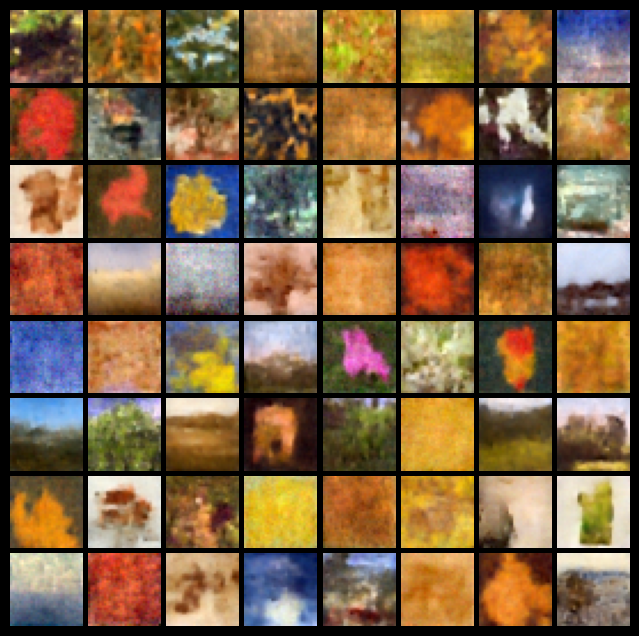

steps 5000.00, loss: 0.036


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

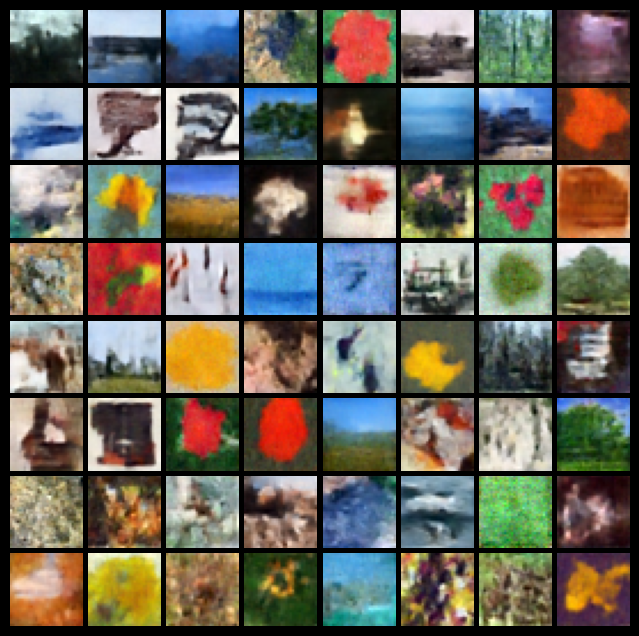

steps 7500.00, loss: 0.034


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

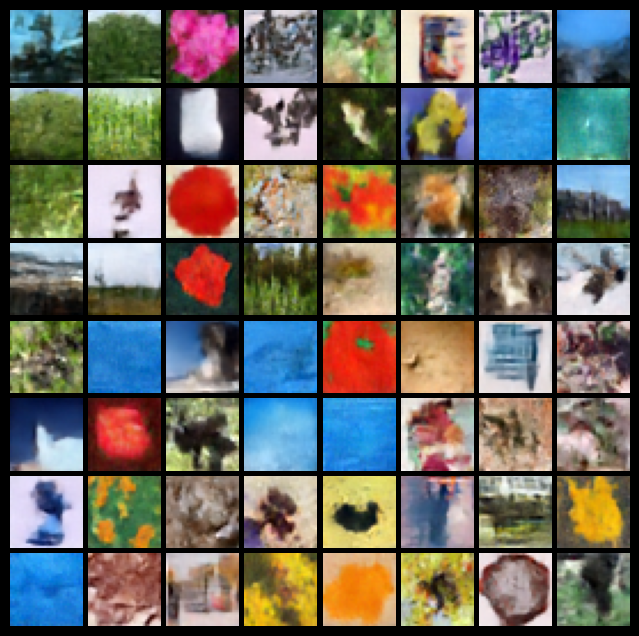

steps 10000.00, loss: 0.034


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

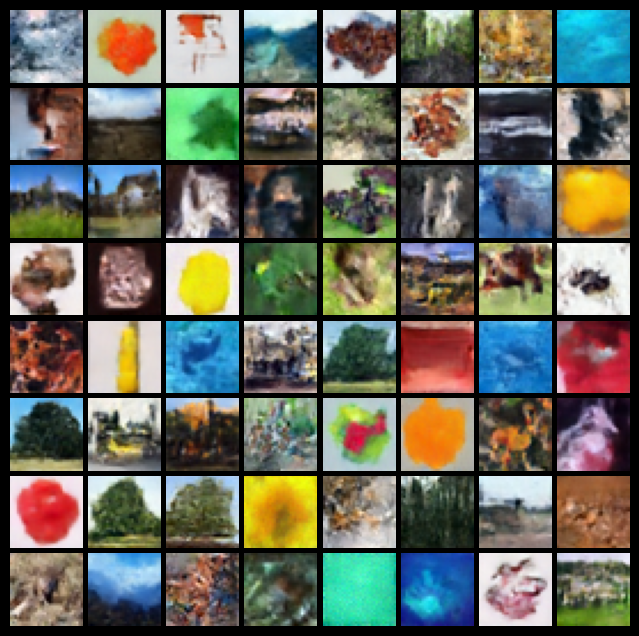

steps 12500.00, loss: 0.033


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

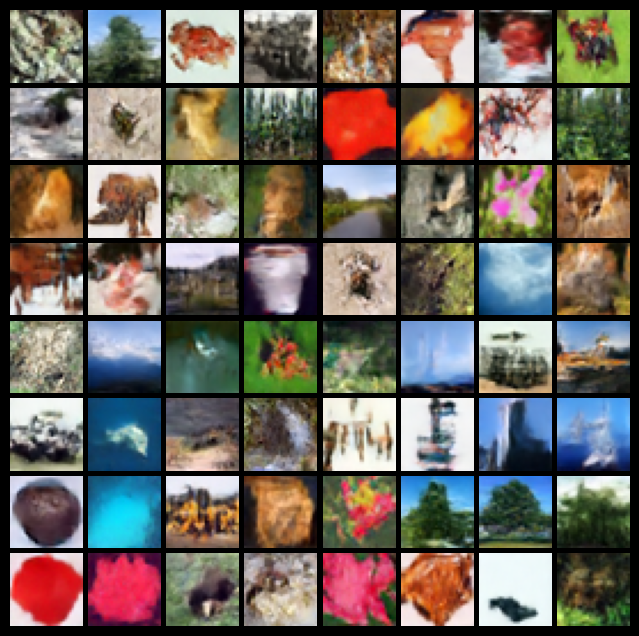

steps 15000.00, loss: 0.033


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

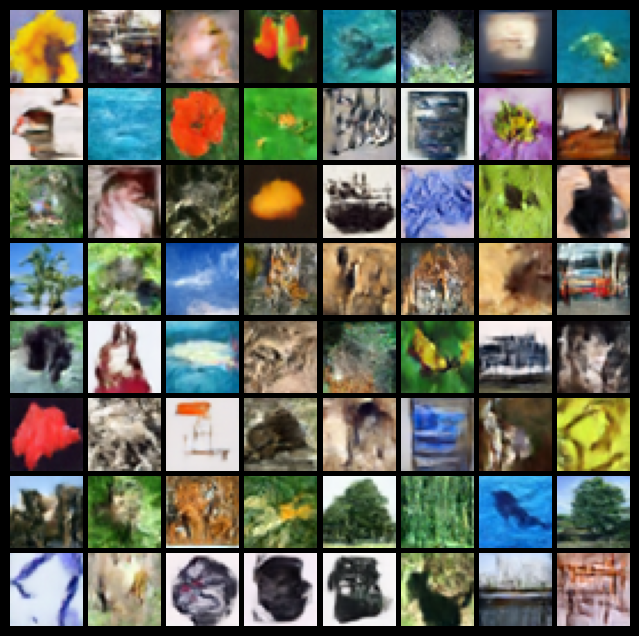

steps 17500.00, loss: 0.032


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

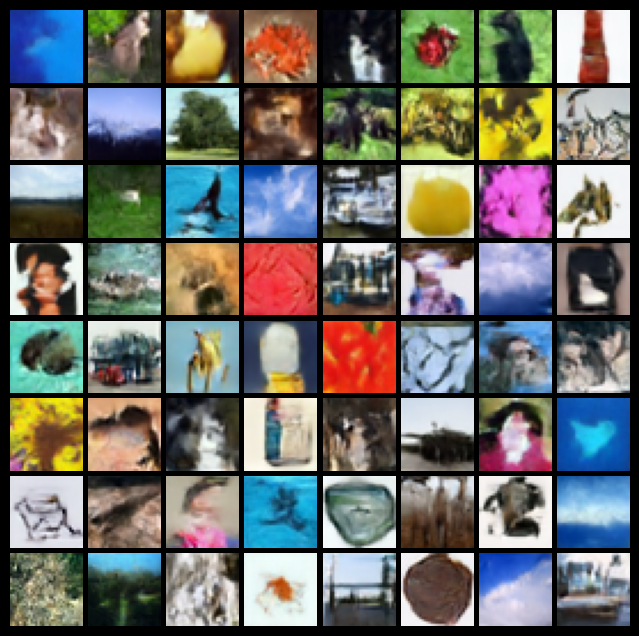

steps 20000.00, loss: 0.032


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

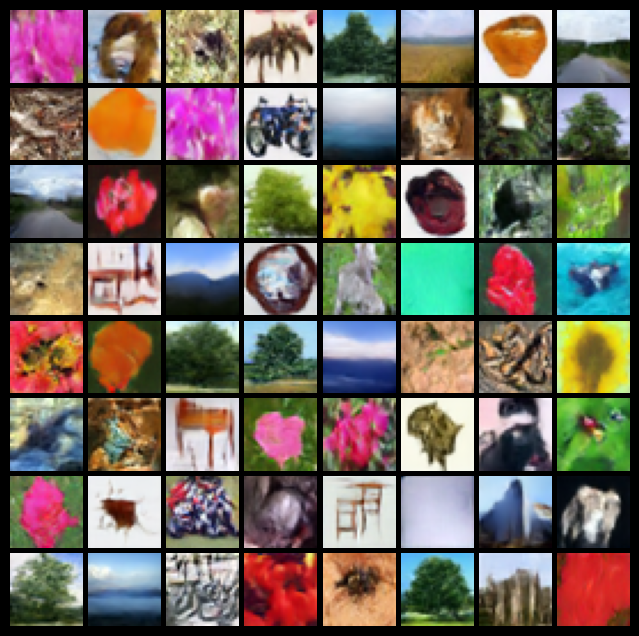

steps 22500.00, loss: 0.032


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

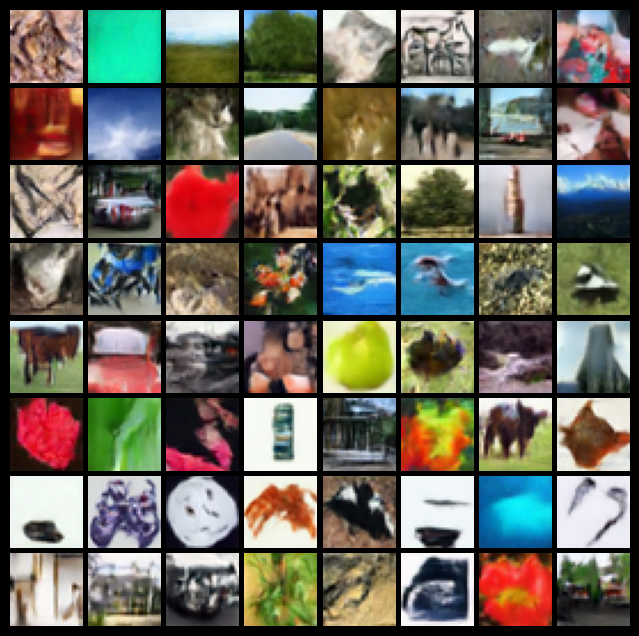

steps 25000.00, loss: 0.032


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

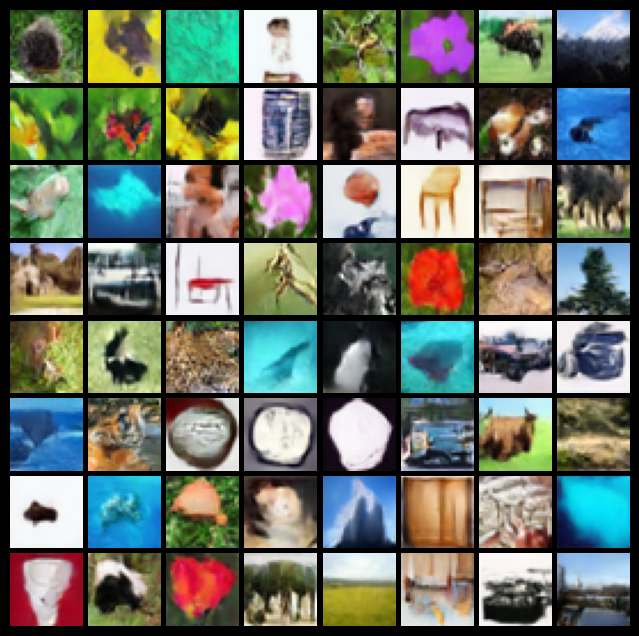

steps 27500.00, loss: 0.031


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

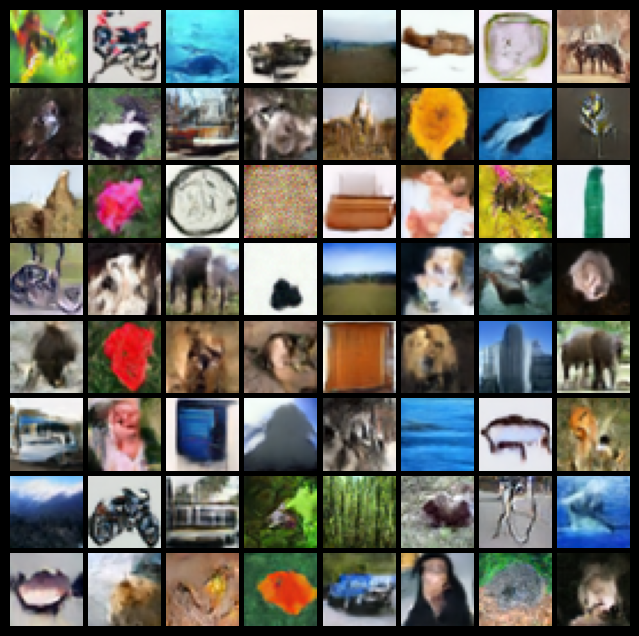

steps 30000.00, loss: 0.031


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

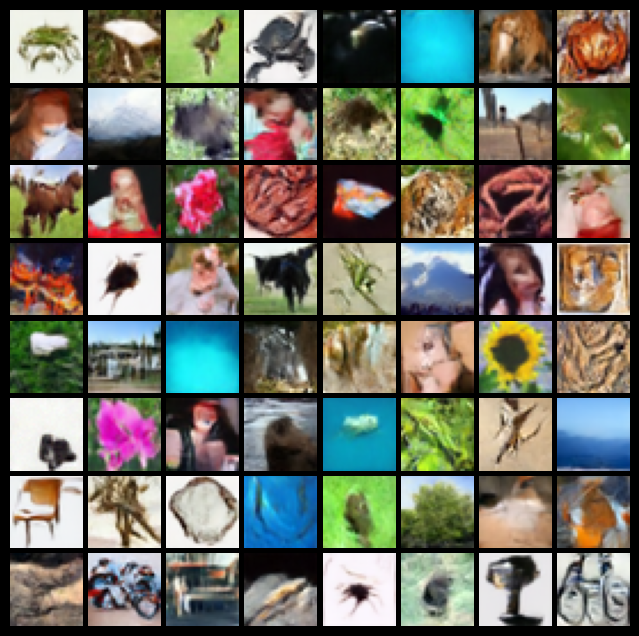

steps 32500.00, loss: 0.031


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

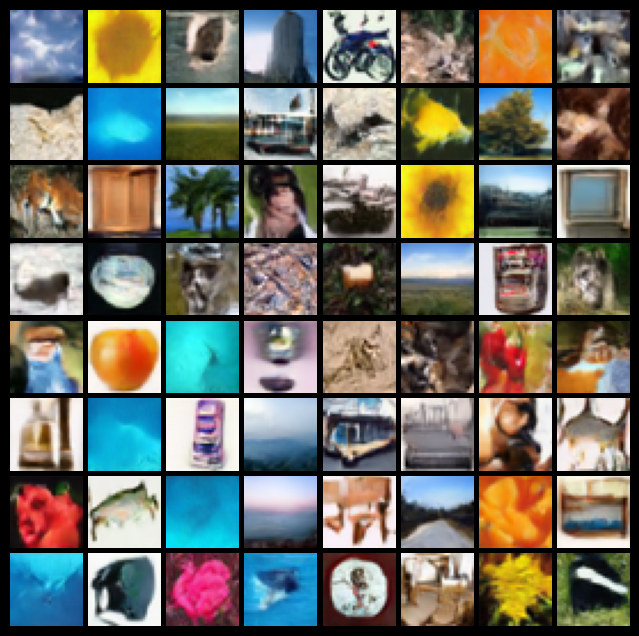

steps 35000.00, loss: 0.031


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

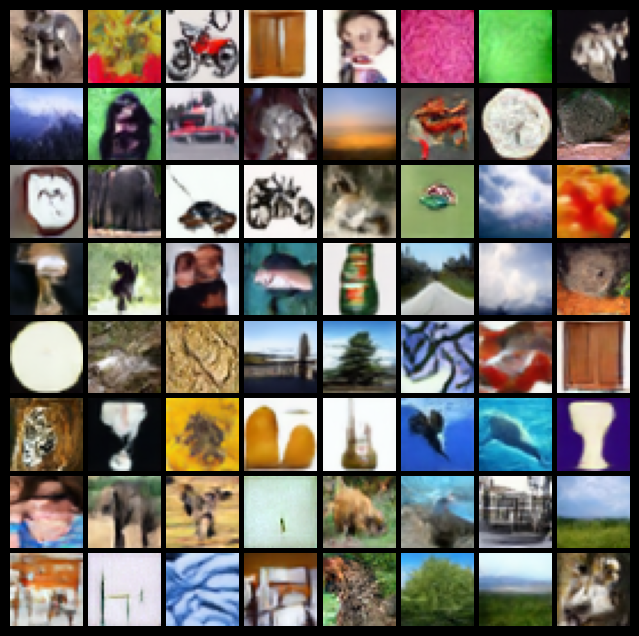

steps 37500.00, loss: 0.031


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

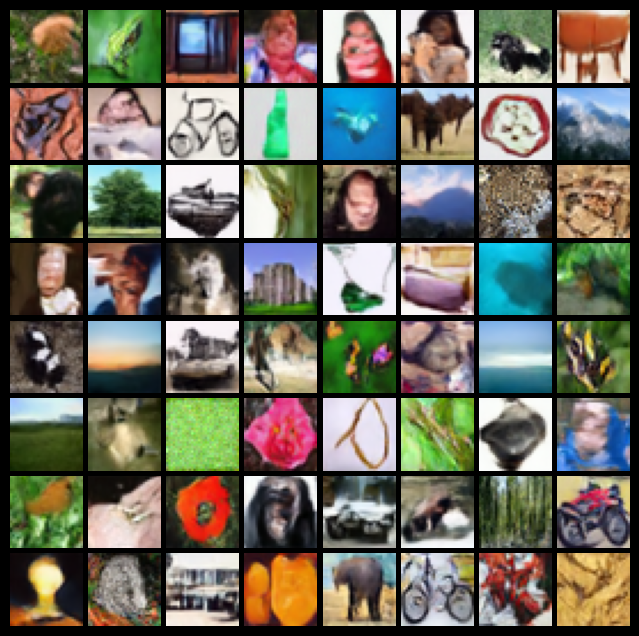

steps 40000.00, loss: 0.031


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

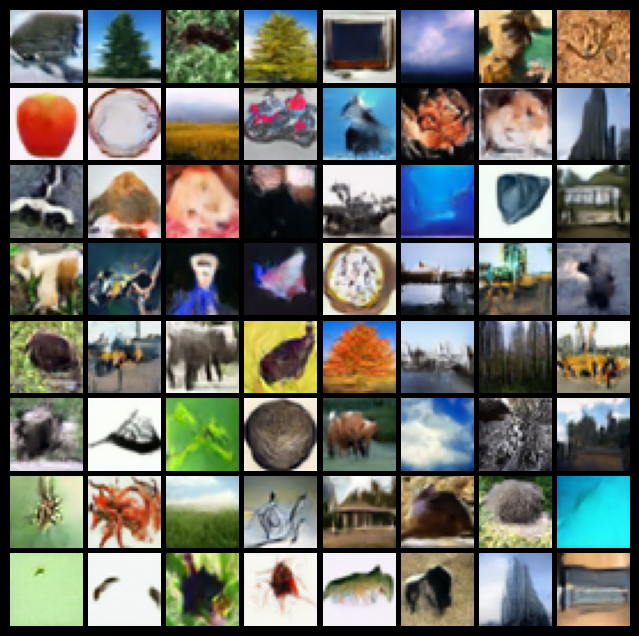

steps 42500.00, loss: 0.031


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

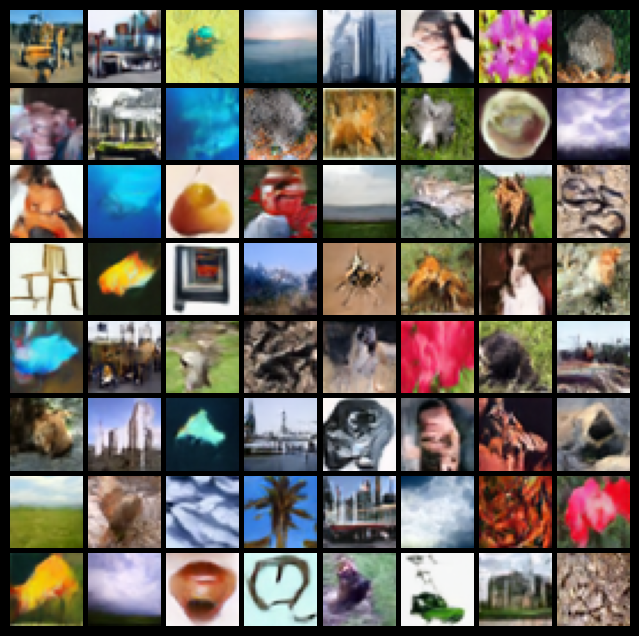

steps 45000.00, loss: 0.031


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

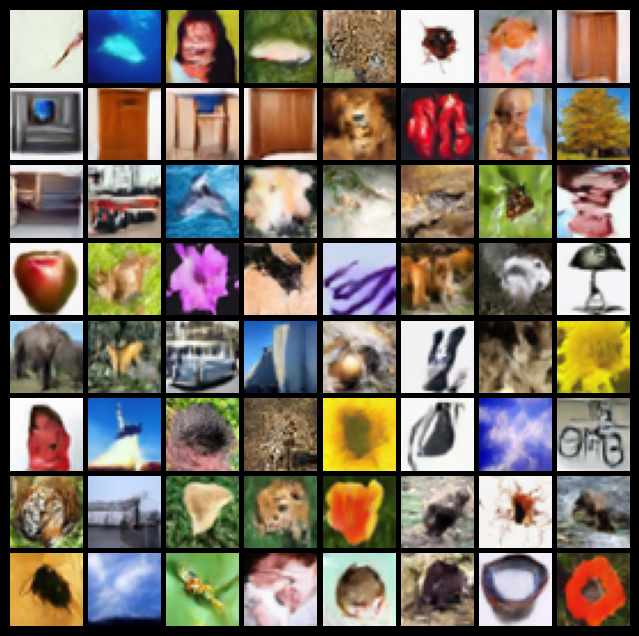

steps 47500.00, loss: 0.031


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

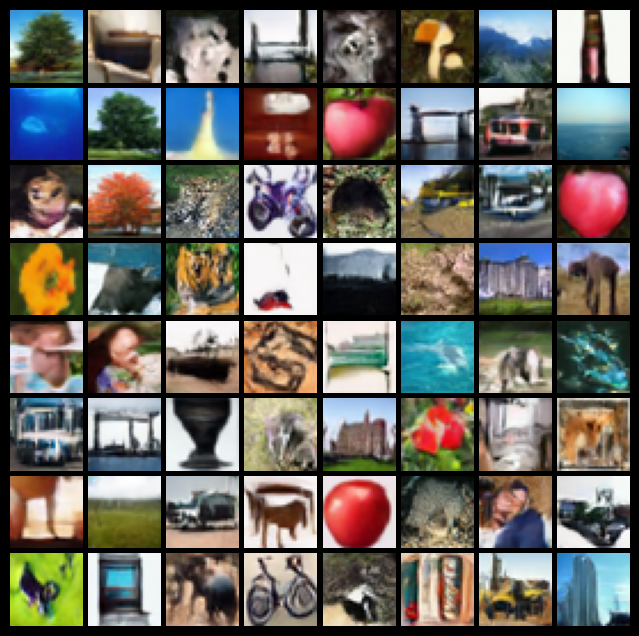

steps 50000.00, loss: 0.031


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

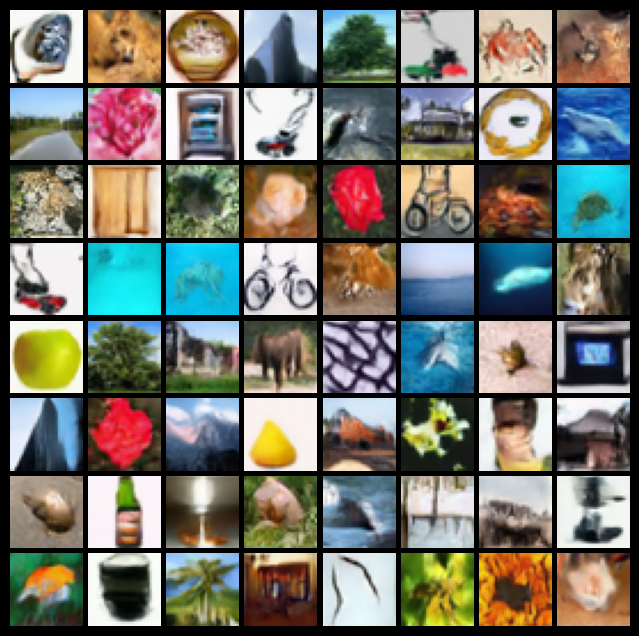

In [ ]:
from torch.nn.utils import clip_grad_norm_


# while (steps < 50000):
while (steps < 50000):

  # arrays for metrics
    loss_arr = np.zeros(0)
    for i in range(2500):
      images, labels = next(train_iterator)
      images, labels = images.to(device), labels.to(device)

      # cfg - labels None 10% of time - model learns to do conditional and unconditional sampling
      if np.random.random() < 0.1:
        labels = None

      optimiser.zero_grad()
      batch_size = images.shape[0]

      t = torch.randint(0, DIFFUSION_TIME_STEPS, (batch_size,), device=device).long()
      loss = p_losses(N, images, t, labels)
      loss.backward()
      optimiser.step()
      ema.step_ema(ema_model, N )
      clip_grad_norm_(N.parameters(),1.0)
      steps += 1
      loss_arr = np.append(loss_arr, loss.item())

    # print loss / show images
    print('steps {:.2f}, loss: {:.3f}'.format(steps, loss_arr.mean()))

    # sample 64 images
    samples = sample(ema_model, image_size=image_size, batch_size=64, channels=params['n_channels'])
    num_images = len(samples[-1])

    # Number of rows and columns for the grid
    rows, cols = 8, 8

    # GridSpec layout for finer control
    fig = plt.figure(figsize=(8, 8),facecolor='black')
    gs = gridspec.GridSpec(rows, cols, wspace=0.07, hspace=0.07)

    # Loop through each subplot and display an image
    for i in range(rows * cols):
        ax = plt.subplot(gs[i])

        # Get the image from the samples
        # Ensure you handle the case where the number of images is less than 64
        image = samples[-1][i] if i < num_images else np.zeros((image_size, image_size, params['n_channels']))


        # If the image is in (channels, height, width) format, transpose it to (height, width, channels)
        if image.ndim == 3 and image.shape[0] in [1, 3]:
          image = image.transpose(1, 2, 0)
        # Normalize the image to the range [0, 1] if it's not already
        image = (image - image.min()) / (image.max() - image.min())
        # Display the image in the subplot
        ax.imshow(image)
        ax.axis('off')  # Turn off axis

    # Adjust layout and display
    plt.tight_layout(pad=0.1)
    plt.show()

torch.save(ema_model.state_dict(), 'ema_model_weights.pth')


**Latent interpolations**

In [61]:
from PIL import Image

# define model again (sometimes I ran this cell in a new session and so loaded in the EMA weights from scratch)
N = Unet(
    dim=32, #ciphar-100 is 32x32
    channels=params['n_channels'],
    dim_mults=(1, 2, 4,)
)
ema_model = copy.deepcopy(N).eval().requires_grad_(False)

# load weights from training
ema_model.load_state_dict(torch.load('ema_model_weights.pth'))
if torch.cuda.is_available():
    device = torch.device("cuda")  # Use the default GPU
else:
    device = torch.device("cpu")   # If no GPU is available, use CPU

ema_model.to(device)


# function to generate a single image given a class and noise starter image
def gen_image(t_class,noise):
  samples = None
  if t_class != None:
    samples = sample(ema_model, image_size=image_size, batch_size=1, channels=params['n_channels'],classs=t_class, noise_img = noise)
  else:
    samples = sample(ema_model, image_size=image_size, batch_size=1, channels=params['n_channels'],classs=t_class, noise_img = noise,uc=True)


  image = samples[-1][0]
  if image.ndim == 3 and image.shape[0] in [1, 3]:
    image = image.transpose(1, 2, 0)

  image = (image - image.min()) / (image.max() - image.min())
  return image

# grid of images to display
grid_images = []
# just gen 1 image each time you sample
batch_size = 1
for i in range(0,8):
  # pick a random class to interpolate over
  the_class = random.randint(0,100)
  shape=(batch_size, params['n_channels'], image_size, image_size)
  # generate some random noise
  random_noise1 = torch.randn(shape, device=device)

  # get a image using this noise
  new_img = gen_image(the_class,random_noise1)
  grid_images.append(new_img)

  # generate some more random noise (the end point of our interpolation)
  random_noise2 = torch.randn(shape, device=device)

  # 8 - start - end
  steps = 6  # Number of interpolation steps

  for step in range(0,6):
    alpha = step / 5
    interp_noise = torch.lerp(random_noise1,random_noise2,alpha)
    new_img = gen_image(None,interp_noise)
    grid_images.append(new_img)
  # use a class label at the end here
  last_img = gen_image(the_class,random_noise2)
  grid_images.append(last_img)

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

64


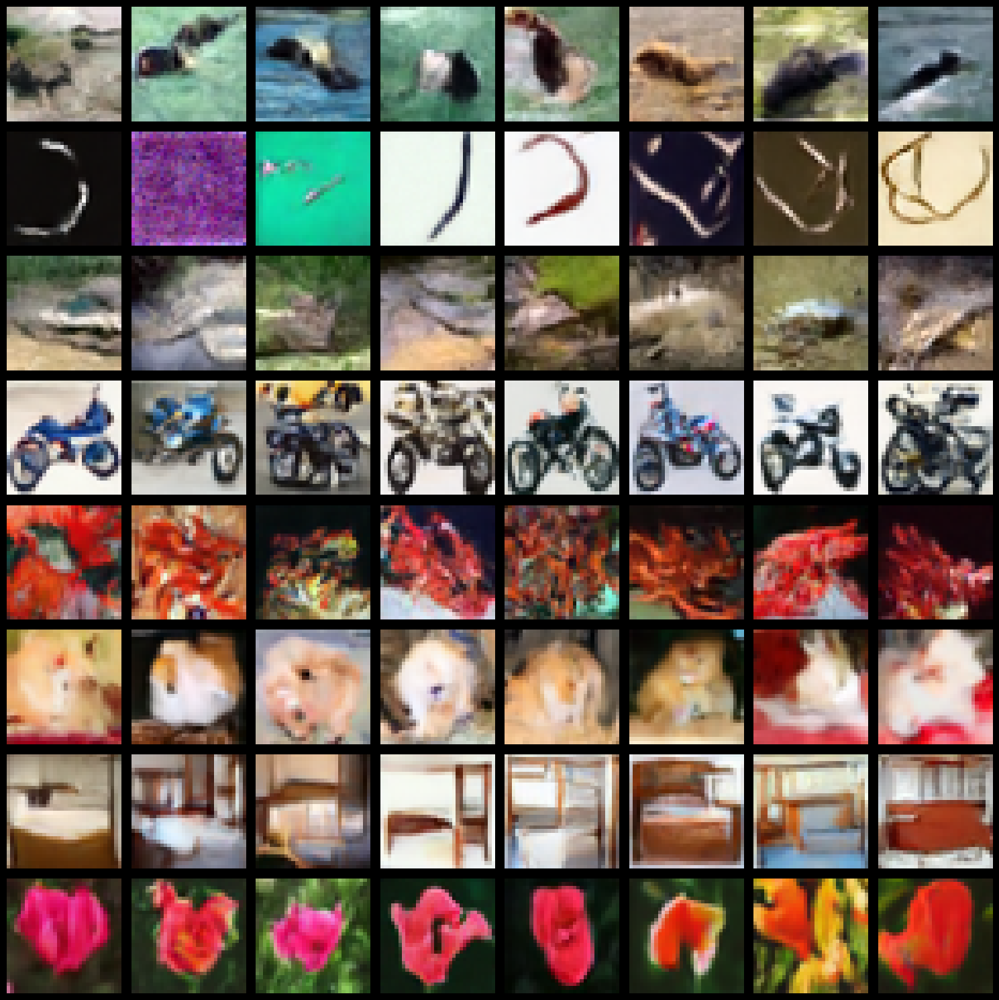

In [62]:

# Display the interpolations
fig, axes = plt.subplots(nrows=8, ncols=8, figsize=(15, 15))


print(len(grid_images))

# Flatten the axes array for easy iteration
axes = axes.flatten()

for i, img in enumerate(grid_images):
    axes[i].imshow(img)  # Plot image
    axes[i].axis('off')  # Hide axis
    axes[i].set_facecolor('black')  # Set the background color of each subplot to black

plt.tight_layout()
plt.gcf().set_facecolor('black')  # Set the background color of the entire figure to black
plt.show()

**FID scores**

Evaluate the FID from 10k of your model samples (do not sample more than this) and compare it against the 10k test images. Calculating FID is somewhat involved, so we use a library for it. It can take a few minutes to evaluate. Lower FID scores are better.

In [63]:
%%capture
!pip install clean-fid
import os
from cleanfid import fid
from torchvision.utils import save_image

In [65]:
from PIL import Image

# load in ema weights - this is usually ran after training as I didnt want to train the weights everytime
N = Unet(
    dim=32, #ciphar-100 is 32x32
    channels=params['n_channels'],
    dim_mults=(1, 2, 4,)
)
ema_model = copy.deepcopy(N).eval().requires_grad_(False)
ema_model.load_state_dict(torch.load('ema_model_weights.pth'))

BATCH_SIZE = 64

# define directories
real_images_dir = 'real_images'
generated_images_dir = 'generated_images'
num_samples = 10000 # do not change

# create/clean the directories
def setup_directory(directory):
    if os.path.exists(directory):
        !rm -r {directory} # remove any existing (old) data
    os.makedirs(directory)

setup_directory(real_images_dir)
setup_directory(generated_images_dir)

# put the model on a cuda device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
ema_model = ema_model.to(device)



# generate and save 10k model samples
num_generated = 0

while num_generated < num_samples:
    # sample from your model, you can modify this
    samples = sample(ema_model, image_size=image_size, batch_size=BATCH_SIZE, channels=params['n_channels'])
    num_images = len(samples[-1])
    for  i in range(0,num_images-1):
        image = samples[-1][i] if i < BATCH_SIZE else np.zeros((image_size, image_size, params['n_channels']))
        # convert image to correct form
        if image.ndim == 3 and image.shape[0] in [1, 3]:
          image = image.transpose(1, 2, 0)
        # normalisse
        image = (image - image.min()) / (image.max() - image.min())

        if num_generated >= num_samples:
            break
        # save image to the folder
        plt.imsave(os.path.join(generated_images_dir, f"gen_img_{num_generated}.png"),image)
        num_generated += 1
        print(str(num_generated) +"/"+str(num_samples))

# save 10k images from the CIFAR-100 test dataset
num_saved_real = 0
while num_saved_real < num_samples:
    real_samples_batch, _ = next(test_iterator)
    for image in real_samples_batch:
        if num_saved_real >= num_samples:
            break
        save_image(image, os.path.join(real_images_dir, f"real_img_{num_saved_real}.png"))
        num_saved_real += 1

sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

1/10000
2/10000
3/10000
4/10000
5/10000
6/10000
7/10000
8/10000
9/10000
10/10000
11/10000
12/10000
13/10000
14/10000
15/10000
16/10000
17/10000
18/10000
19/10000
20/10000
21/10000
22/10000
23/10000
24/10000
25/10000
26/10000
27/10000
28/10000
29/10000
30/10000
31/10000
32/10000
33/10000
34/10000
35/10000
36/10000
37/10000
38/10000
39/10000
40/10000
41/10000
42/10000
43/10000
44/10000
45/10000
46/10000
47/10000
48/10000
49/10000
50/10000
51/10000
52/10000
53/10000
54/10000
55/10000
56/10000
57/10000
58/10000
59/10000
60/10000
61/10000
62/10000
63/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

64/10000
65/10000
66/10000
67/10000
68/10000
69/10000
70/10000
71/10000
72/10000
73/10000
74/10000
75/10000
76/10000
77/10000
78/10000
79/10000
80/10000
81/10000
82/10000
83/10000
84/10000
85/10000
86/10000
87/10000
88/10000
89/10000
90/10000
91/10000
92/10000
93/10000
94/10000
95/10000
96/10000
97/10000
98/10000
99/10000
100/10000
101/10000
102/10000
103/10000
104/10000
105/10000
106/10000
107/10000
108/10000
109/10000
110/10000
111/10000
112/10000
113/10000
114/10000
115/10000
116/10000
117/10000
118/10000
119/10000
120/10000
121/10000
122/10000
123/10000
124/10000
125/10000
126/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

127/10000
128/10000
129/10000
130/10000
131/10000
132/10000
133/10000
134/10000
135/10000
136/10000
137/10000
138/10000
139/10000
140/10000
141/10000
142/10000
143/10000
144/10000
145/10000
146/10000
147/10000
148/10000
149/10000
150/10000
151/10000
152/10000
153/10000
154/10000
155/10000
156/10000
157/10000
158/10000
159/10000
160/10000
161/10000
162/10000
163/10000
164/10000
165/10000
166/10000
167/10000
168/10000
169/10000
170/10000
171/10000
172/10000
173/10000
174/10000
175/10000
176/10000
177/10000
178/10000
179/10000
180/10000
181/10000
182/10000
183/10000
184/10000
185/10000
186/10000
187/10000
188/10000
189/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

190/10000
191/10000
192/10000
193/10000
194/10000
195/10000
196/10000
197/10000
198/10000
199/10000
200/10000
201/10000
202/10000
203/10000
204/10000
205/10000
206/10000
207/10000
208/10000
209/10000
210/10000
211/10000
212/10000
213/10000
214/10000
215/10000
216/10000
217/10000
218/10000
219/10000
220/10000
221/10000
222/10000
223/10000
224/10000
225/10000
226/10000
227/10000
228/10000
229/10000
230/10000
231/10000
232/10000
233/10000
234/10000
235/10000
236/10000
237/10000
238/10000
239/10000
240/10000
241/10000
242/10000
243/10000
244/10000
245/10000
246/10000
247/10000
248/10000
249/10000
250/10000
251/10000
252/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

253/10000
254/10000
255/10000
256/10000
257/10000
258/10000
259/10000
260/10000
261/10000
262/10000
263/10000
264/10000
265/10000
266/10000
267/10000
268/10000
269/10000
270/10000
271/10000
272/10000
273/10000
274/10000
275/10000
276/10000
277/10000
278/10000
279/10000
280/10000
281/10000
282/10000
283/10000
284/10000
285/10000
286/10000
287/10000
288/10000
289/10000
290/10000
291/10000
292/10000
293/10000
294/10000
295/10000
296/10000
297/10000
298/10000
299/10000
300/10000
301/10000
302/10000
303/10000
304/10000
305/10000
306/10000
307/10000
308/10000
309/10000
310/10000
311/10000
312/10000
313/10000
314/10000
315/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

316/10000
317/10000
318/10000
319/10000
320/10000
321/10000
322/10000
323/10000
324/10000
325/10000
326/10000
327/10000
328/10000
329/10000
330/10000
331/10000
332/10000
333/10000
334/10000
335/10000
336/10000
337/10000
338/10000
339/10000
340/10000
341/10000
342/10000
343/10000
344/10000
345/10000
346/10000
347/10000
348/10000
349/10000
350/10000
351/10000
352/10000
353/10000
354/10000
355/10000
356/10000
357/10000
358/10000
359/10000
360/10000
361/10000
362/10000
363/10000
364/10000
365/10000
366/10000
367/10000
368/10000
369/10000
370/10000
371/10000
372/10000
373/10000
374/10000
375/10000
376/10000
377/10000
378/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

379/10000
380/10000
381/10000
382/10000
383/10000
384/10000
385/10000
386/10000
387/10000
388/10000
389/10000
390/10000
391/10000
392/10000
393/10000
394/10000
395/10000
396/10000
397/10000
398/10000
399/10000
400/10000
401/10000
402/10000
403/10000
404/10000
405/10000
406/10000
407/10000
408/10000
409/10000
410/10000
411/10000
412/10000
413/10000
414/10000
415/10000
416/10000
417/10000
418/10000
419/10000
420/10000
421/10000
422/10000
423/10000
424/10000
425/10000
426/10000
427/10000
428/10000
429/10000
430/10000
431/10000
432/10000
433/10000
434/10000
435/10000
436/10000
437/10000
438/10000
439/10000
440/10000
441/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

442/10000
443/10000
444/10000
445/10000
446/10000
447/10000
448/10000
449/10000
450/10000
451/10000
452/10000
453/10000
454/10000
455/10000
456/10000
457/10000
458/10000
459/10000
460/10000
461/10000
462/10000
463/10000
464/10000
465/10000
466/10000
467/10000
468/10000
469/10000
470/10000
471/10000
472/10000
473/10000
474/10000
475/10000
476/10000
477/10000
478/10000
479/10000
480/10000
481/10000
482/10000
483/10000
484/10000
485/10000
486/10000
487/10000
488/10000
489/10000
490/10000
491/10000
492/10000
493/10000
494/10000
495/10000
496/10000
497/10000
498/10000
499/10000
500/10000
501/10000
502/10000
503/10000
504/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

505/10000
506/10000
507/10000
508/10000
509/10000
510/10000
511/10000
512/10000
513/10000
514/10000
515/10000
516/10000
517/10000
518/10000
519/10000
520/10000
521/10000
522/10000
523/10000
524/10000
525/10000
526/10000
527/10000
528/10000
529/10000
530/10000
531/10000
532/10000
533/10000
534/10000
535/10000
536/10000
537/10000
538/10000
539/10000
540/10000
541/10000
542/10000
543/10000
544/10000
545/10000
546/10000
547/10000
548/10000
549/10000
550/10000
551/10000
552/10000
553/10000
554/10000
555/10000
556/10000
557/10000
558/10000
559/10000
560/10000
561/10000
562/10000
563/10000
564/10000
565/10000
566/10000
567/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

568/10000
569/10000
570/10000
571/10000
572/10000
573/10000
574/10000
575/10000
576/10000
577/10000
578/10000
579/10000
580/10000
581/10000
582/10000
583/10000
584/10000
585/10000
586/10000
587/10000
588/10000
589/10000
590/10000
591/10000
592/10000
593/10000
594/10000
595/10000
596/10000
597/10000
598/10000
599/10000
600/10000
601/10000
602/10000
603/10000
604/10000
605/10000
606/10000
607/10000
608/10000
609/10000
610/10000
611/10000
612/10000
613/10000
614/10000
615/10000
616/10000
617/10000
618/10000
619/10000
620/10000
621/10000
622/10000
623/10000
624/10000
625/10000
626/10000
627/10000
628/10000
629/10000
630/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

631/10000
632/10000
633/10000
634/10000
635/10000
636/10000
637/10000
638/10000
639/10000
640/10000
641/10000
642/10000
643/10000
644/10000
645/10000
646/10000
647/10000
648/10000
649/10000
650/10000
651/10000
652/10000
653/10000
654/10000
655/10000
656/10000
657/10000
658/10000
659/10000
660/10000
661/10000
662/10000
663/10000
664/10000
665/10000
666/10000
667/10000
668/10000
669/10000
670/10000
671/10000
672/10000
673/10000
674/10000
675/10000
676/10000
677/10000
678/10000
679/10000
680/10000
681/10000
682/10000
683/10000
684/10000
685/10000
686/10000
687/10000
688/10000
689/10000
690/10000
691/10000
692/10000
693/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

694/10000
695/10000
696/10000
697/10000
698/10000
699/10000
700/10000
701/10000
702/10000
703/10000
704/10000
705/10000
706/10000
707/10000
708/10000
709/10000
710/10000
711/10000
712/10000
713/10000
714/10000
715/10000
716/10000
717/10000
718/10000
719/10000
720/10000
721/10000
722/10000
723/10000
724/10000
725/10000
726/10000
727/10000
728/10000
729/10000
730/10000
731/10000
732/10000
733/10000
734/10000
735/10000
736/10000
737/10000
738/10000
739/10000
740/10000
741/10000
742/10000
743/10000
744/10000
745/10000
746/10000
747/10000
748/10000
749/10000
750/10000
751/10000
752/10000
753/10000
754/10000
755/10000
756/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

757/10000
758/10000
759/10000
760/10000
761/10000
762/10000
763/10000
764/10000
765/10000
766/10000
767/10000
768/10000
769/10000
770/10000
771/10000
772/10000
773/10000
774/10000
775/10000
776/10000
777/10000
778/10000
779/10000
780/10000
781/10000
782/10000
783/10000
784/10000
785/10000
786/10000
787/10000
788/10000
789/10000
790/10000
791/10000
792/10000
793/10000
794/10000
795/10000
796/10000
797/10000
798/10000
799/10000
800/10000
801/10000
802/10000
803/10000
804/10000
805/10000
806/10000
807/10000
808/10000
809/10000
810/10000
811/10000
812/10000
813/10000
814/10000
815/10000
816/10000
817/10000
818/10000
819/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

820/10000
821/10000
822/10000
823/10000
824/10000
825/10000
826/10000
827/10000
828/10000
829/10000
830/10000
831/10000
832/10000
833/10000
834/10000
835/10000
836/10000
837/10000
838/10000
839/10000
840/10000
841/10000
842/10000
843/10000
844/10000
845/10000
846/10000
847/10000
848/10000
849/10000
850/10000
851/10000
852/10000
853/10000
854/10000
855/10000
856/10000
857/10000
858/10000
859/10000
860/10000
861/10000
862/10000
863/10000
864/10000
865/10000
866/10000
867/10000
868/10000
869/10000
870/10000
871/10000
872/10000
873/10000
874/10000
875/10000
876/10000
877/10000
878/10000
879/10000
880/10000
881/10000
882/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

883/10000
884/10000
885/10000
886/10000
887/10000
888/10000
889/10000
890/10000
891/10000
892/10000
893/10000
894/10000
895/10000
896/10000
897/10000
898/10000
899/10000
900/10000
901/10000
902/10000
903/10000
904/10000
905/10000
906/10000
907/10000
908/10000
909/10000
910/10000
911/10000
912/10000
913/10000
914/10000
915/10000
916/10000
917/10000
918/10000
919/10000
920/10000
921/10000
922/10000
923/10000
924/10000
925/10000
926/10000
927/10000
928/10000
929/10000
930/10000
931/10000
932/10000
933/10000
934/10000
935/10000
936/10000
937/10000
938/10000
939/10000
940/10000
941/10000
942/10000
943/10000
944/10000
945/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

946/10000
947/10000
948/10000
949/10000
950/10000
951/10000
952/10000
953/10000
954/10000
955/10000
956/10000
957/10000
958/10000
959/10000
960/10000
961/10000
962/10000
963/10000
964/10000
965/10000
966/10000
967/10000
968/10000
969/10000
970/10000
971/10000
972/10000
973/10000
974/10000
975/10000
976/10000
977/10000
978/10000
979/10000
980/10000
981/10000
982/10000
983/10000
984/10000
985/10000
986/10000
987/10000
988/10000
989/10000
990/10000
991/10000
992/10000
993/10000
994/10000
995/10000
996/10000
997/10000
998/10000
999/10000
1000/10000
1001/10000
1002/10000
1003/10000
1004/10000
1005/10000
1006/10000
1007/10000
1008/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

1009/10000
1010/10000
1011/10000
1012/10000
1013/10000
1014/10000
1015/10000
1016/10000
1017/10000
1018/10000
1019/10000
1020/10000
1021/10000
1022/10000
1023/10000
1024/10000
1025/10000
1026/10000
1027/10000
1028/10000
1029/10000
1030/10000
1031/10000
1032/10000
1033/10000
1034/10000
1035/10000
1036/10000
1037/10000
1038/10000
1039/10000
1040/10000
1041/10000
1042/10000
1043/10000
1044/10000
1045/10000
1046/10000
1047/10000
1048/10000
1049/10000
1050/10000
1051/10000
1052/10000
1053/10000
1054/10000
1055/10000
1056/10000
1057/10000
1058/10000
1059/10000
1060/10000
1061/10000
1062/10000
1063/10000
1064/10000
1065/10000
1066/10000
1067/10000
1068/10000
1069/10000
1070/10000
1071/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

1072/10000
1073/10000
1074/10000
1075/10000
1076/10000
1077/10000
1078/10000
1079/10000
1080/10000
1081/10000
1082/10000
1083/10000
1084/10000
1085/10000
1086/10000
1087/10000
1088/10000
1089/10000
1090/10000
1091/10000
1092/10000
1093/10000
1094/10000
1095/10000
1096/10000
1097/10000
1098/10000
1099/10000
1100/10000
1101/10000
1102/10000
1103/10000
1104/10000
1105/10000
1106/10000
1107/10000
1108/10000
1109/10000
1110/10000
1111/10000
1112/10000
1113/10000
1114/10000
1115/10000
1116/10000
1117/10000
1118/10000
1119/10000
1120/10000
1121/10000
1122/10000
1123/10000
1124/10000
1125/10000
1126/10000
1127/10000
1128/10000
1129/10000
1130/10000
1131/10000
1132/10000
1133/10000
1134/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

1135/10000
1136/10000
1137/10000
1138/10000
1139/10000
1140/10000
1141/10000
1142/10000
1143/10000
1144/10000
1145/10000
1146/10000
1147/10000
1148/10000
1149/10000
1150/10000
1151/10000
1152/10000
1153/10000
1154/10000
1155/10000
1156/10000
1157/10000
1158/10000
1159/10000
1160/10000
1161/10000
1162/10000
1163/10000
1164/10000
1165/10000
1166/10000
1167/10000
1168/10000
1169/10000
1170/10000
1171/10000
1172/10000
1173/10000
1174/10000
1175/10000
1176/10000
1177/10000
1178/10000
1179/10000
1180/10000
1181/10000
1182/10000
1183/10000
1184/10000
1185/10000
1186/10000
1187/10000
1188/10000
1189/10000
1190/10000
1191/10000
1192/10000
1193/10000
1194/10000
1195/10000
1196/10000
1197/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

1198/10000
1199/10000
1200/10000
1201/10000
1202/10000
1203/10000
1204/10000
1205/10000
1206/10000
1207/10000
1208/10000
1209/10000
1210/10000
1211/10000
1212/10000
1213/10000
1214/10000
1215/10000
1216/10000
1217/10000
1218/10000
1219/10000
1220/10000
1221/10000
1222/10000
1223/10000
1224/10000
1225/10000
1226/10000
1227/10000
1228/10000
1229/10000
1230/10000
1231/10000
1232/10000
1233/10000
1234/10000
1235/10000
1236/10000
1237/10000
1238/10000
1239/10000
1240/10000
1241/10000
1242/10000
1243/10000
1244/10000
1245/10000
1246/10000
1247/10000
1248/10000
1249/10000
1250/10000
1251/10000
1252/10000
1253/10000
1254/10000
1255/10000
1256/10000
1257/10000
1258/10000
1259/10000
1260/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

1261/10000
1262/10000
1263/10000
1264/10000
1265/10000
1266/10000
1267/10000
1268/10000
1269/10000
1270/10000
1271/10000
1272/10000
1273/10000
1274/10000
1275/10000
1276/10000
1277/10000
1278/10000
1279/10000
1280/10000
1281/10000
1282/10000
1283/10000
1284/10000
1285/10000
1286/10000
1287/10000
1288/10000
1289/10000
1290/10000
1291/10000
1292/10000
1293/10000
1294/10000
1295/10000
1296/10000
1297/10000
1298/10000
1299/10000
1300/10000
1301/10000
1302/10000
1303/10000
1304/10000
1305/10000
1306/10000
1307/10000
1308/10000
1309/10000
1310/10000
1311/10000
1312/10000
1313/10000
1314/10000
1315/10000
1316/10000
1317/10000
1318/10000
1319/10000
1320/10000
1321/10000
1322/10000
1323/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

1324/10000
1325/10000
1326/10000
1327/10000
1328/10000
1329/10000
1330/10000
1331/10000
1332/10000
1333/10000
1334/10000
1335/10000
1336/10000
1337/10000
1338/10000
1339/10000
1340/10000
1341/10000
1342/10000
1343/10000
1344/10000
1345/10000
1346/10000
1347/10000
1348/10000
1349/10000
1350/10000
1351/10000
1352/10000
1353/10000
1354/10000
1355/10000
1356/10000
1357/10000
1358/10000
1359/10000
1360/10000
1361/10000
1362/10000
1363/10000
1364/10000
1365/10000
1366/10000
1367/10000
1368/10000
1369/10000
1370/10000
1371/10000
1372/10000
1373/10000
1374/10000
1375/10000
1376/10000
1377/10000
1378/10000
1379/10000
1380/10000
1381/10000
1382/10000
1383/10000
1384/10000
1385/10000
1386/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

1387/10000
1388/10000
1389/10000
1390/10000
1391/10000
1392/10000
1393/10000
1394/10000
1395/10000
1396/10000
1397/10000
1398/10000
1399/10000
1400/10000
1401/10000
1402/10000
1403/10000
1404/10000
1405/10000
1406/10000
1407/10000
1408/10000
1409/10000
1410/10000
1411/10000
1412/10000
1413/10000
1414/10000
1415/10000
1416/10000
1417/10000
1418/10000
1419/10000
1420/10000
1421/10000
1422/10000
1423/10000
1424/10000
1425/10000
1426/10000
1427/10000
1428/10000
1429/10000
1430/10000
1431/10000
1432/10000
1433/10000
1434/10000
1435/10000
1436/10000
1437/10000
1438/10000
1439/10000
1440/10000
1441/10000
1442/10000
1443/10000
1444/10000
1445/10000
1446/10000
1447/10000
1448/10000
1449/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

1450/10000
1451/10000
1452/10000
1453/10000
1454/10000
1455/10000
1456/10000
1457/10000
1458/10000
1459/10000
1460/10000
1461/10000
1462/10000
1463/10000
1464/10000
1465/10000
1466/10000
1467/10000
1468/10000
1469/10000
1470/10000
1471/10000
1472/10000
1473/10000
1474/10000
1475/10000
1476/10000
1477/10000
1478/10000
1479/10000
1480/10000
1481/10000
1482/10000
1483/10000
1484/10000
1485/10000
1486/10000
1487/10000
1488/10000
1489/10000
1490/10000
1491/10000
1492/10000
1493/10000
1494/10000
1495/10000
1496/10000
1497/10000
1498/10000
1499/10000
1500/10000
1501/10000
1502/10000
1503/10000
1504/10000
1505/10000
1506/10000
1507/10000
1508/10000
1509/10000
1510/10000
1511/10000
1512/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

1513/10000
1514/10000
1515/10000
1516/10000
1517/10000
1518/10000
1519/10000
1520/10000
1521/10000
1522/10000
1523/10000
1524/10000
1525/10000
1526/10000
1527/10000
1528/10000
1529/10000
1530/10000
1531/10000
1532/10000
1533/10000
1534/10000
1535/10000
1536/10000
1537/10000
1538/10000
1539/10000
1540/10000
1541/10000
1542/10000
1543/10000
1544/10000
1545/10000
1546/10000
1547/10000
1548/10000
1549/10000
1550/10000
1551/10000
1552/10000
1553/10000
1554/10000
1555/10000
1556/10000
1557/10000
1558/10000
1559/10000
1560/10000
1561/10000
1562/10000
1563/10000
1564/10000
1565/10000
1566/10000
1567/10000
1568/10000
1569/10000
1570/10000
1571/10000
1572/10000
1573/10000
1574/10000
1575/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

1576/10000
1577/10000
1578/10000
1579/10000
1580/10000
1581/10000
1582/10000
1583/10000
1584/10000
1585/10000
1586/10000
1587/10000
1588/10000
1589/10000
1590/10000
1591/10000
1592/10000
1593/10000
1594/10000
1595/10000
1596/10000
1597/10000
1598/10000
1599/10000
1600/10000
1601/10000
1602/10000
1603/10000
1604/10000
1605/10000
1606/10000
1607/10000
1608/10000
1609/10000
1610/10000
1611/10000
1612/10000
1613/10000
1614/10000
1615/10000
1616/10000
1617/10000
1618/10000
1619/10000
1620/10000
1621/10000
1622/10000
1623/10000
1624/10000
1625/10000
1626/10000
1627/10000
1628/10000
1629/10000
1630/10000
1631/10000
1632/10000
1633/10000
1634/10000
1635/10000
1636/10000
1637/10000
1638/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

1639/10000
1640/10000
1641/10000
1642/10000
1643/10000
1644/10000
1645/10000
1646/10000
1647/10000
1648/10000
1649/10000
1650/10000
1651/10000
1652/10000
1653/10000
1654/10000
1655/10000
1656/10000
1657/10000
1658/10000
1659/10000
1660/10000
1661/10000
1662/10000
1663/10000
1664/10000
1665/10000
1666/10000
1667/10000
1668/10000
1669/10000
1670/10000
1671/10000
1672/10000
1673/10000
1674/10000
1675/10000
1676/10000
1677/10000
1678/10000
1679/10000
1680/10000
1681/10000
1682/10000
1683/10000
1684/10000
1685/10000
1686/10000
1687/10000
1688/10000
1689/10000
1690/10000
1691/10000
1692/10000
1693/10000
1694/10000
1695/10000
1696/10000
1697/10000
1698/10000
1699/10000
1700/10000
1701/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

1702/10000
1703/10000
1704/10000
1705/10000
1706/10000
1707/10000
1708/10000
1709/10000
1710/10000
1711/10000
1712/10000
1713/10000
1714/10000
1715/10000
1716/10000
1717/10000
1718/10000
1719/10000
1720/10000
1721/10000
1722/10000
1723/10000
1724/10000
1725/10000
1726/10000
1727/10000
1728/10000
1729/10000
1730/10000
1731/10000
1732/10000
1733/10000
1734/10000
1735/10000
1736/10000
1737/10000
1738/10000
1739/10000
1740/10000
1741/10000
1742/10000
1743/10000
1744/10000
1745/10000
1746/10000
1747/10000
1748/10000
1749/10000
1750/10000
1751/10000
1752/10000
1753/10000
1754/10000
1755/10000
1756/10000
1757/10000
1758/10000
1759/10000
1760/10000
1761/10000
1762/10000
1763/10000
1764/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

1765/10000
1766/10000
1767/10000
1768/10000
1769/10000
1770/10000
1771/10000
1772/10000
1773/10000
1774/10000
1775/10000
1776/10000
1777/10000
1778/10000
1779/10000
1780/10000
1781/10000
1782/10000
1783/10000
1784/10000
1785/10000
1786/10000
1787/10000
1788/10000
1789/10000
1790/10000
1791/10000
1792/10000
1793/10000
1794/10000
1795/10000
1796/10000
1797/10000
1798/10000
1799/10000
1800/10000
1801/10000
1802/10000
1803/10000
1804/10000
1805/10000
1806/10000
1807/10000
1808/10000
1809/10000
1810/10000
1811/10000
1812/10000
1813/10000
1814/10000
1815/10000
1816/10000
1817/10000
1818/10000
1819/10000
1820/10000
1821/10000
1822/10000
1823/10000
1824/10000
1825/10000
1826/10000
1827/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

1828/10000
1829/10000
1830/10000
1831/10000
1832/10000
1833/10000
1834/10000
1835/10000
1836/10000
1837/10000
1838/10000
1839/10000
1840/10000
1841/10000
1842/10000
1843/10000
1844/10000
1845/10000
1846/10000
1847/10000
1848/10000
1849/10000
1850/10000
1851/10000
1852/10000
1853/10000
1854/10000
1855/10000
1856/10000
1857/10000
1858/10000
1859/10000
1860/10000
1861/10000
1862/10000
1863/10000
1864/10000
1865/10000
1866/10000
1867/10000
1868/10000
1869/10000
1870/10000
1871/10000
1872/10000
1873/10000
1874/10000
1875/10000
1876/10000
1877/10000
1878/10000
1879/10000
1880/10000
1881/10000
1882/10000
1883/10000
1884/10000
1885/10000
1886/10000
1887/10000
1888/10000
1889/10000
1890/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

1891/10000
1892/10000
1893/10000
1894/10000
1895/10000
1896/10000
1897/10000
1898/10000
1899/10000
1900/10000
1901/10000
1902/10000
1903/10000
1904/10000
1905/10000
1906/10000
1907/10000
1908/10000
1909/10000
1910/10000
1911/10000
1912/10000
1913/10000
1914/10000
1915/10000
1916/10000
1917/10000
1918/10000
1919/10000
1920/10000
1921/10000
1922/10000
1923/10000
1924/10000
1925/10000
1926/10000
1927/10000
1928/10000
1929/10000
1930/10000
1931/10000
1932/10000
1933/10000
1934/10000
1935/10000
1936/10000
1937/10000
1938/10000
1939/10000
1940/10000
1941/10000
1942/10000
1943/10000
1944/10000
1945/10000
1946/10000
1947/10000
1948/10000
1949/10000
1950/10000
1951/10000
1952/10000
1953/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

1954/10000
1955/10000
1956/10000
1957/10000
1958/10000
1959/10000
1960/10000
1961/10000
1962/10000
1963/10000
1964/10000
1965/10000
1966/10000
1967/10000
1968/10000
1969/10000
1970/10000
1971/10000
1972/10000
1973/10000
1974/10000
1975/10000
1976/10000
1977/10000
1978/10000
1979/10000
1980/10000
1981/10000
1982/10000
1983/10000
1984/10000
1985/10000
1986/10000
1987/10000
1988/10000
1989/10000
1990/10000
1991/10000
1992/10000
1993/10000
1994/10000
1995/10000
1996/10000
1997/10000
1998/10000
1999/10000
2000/10000
2001/10000
2002/10000
2003/10000
2004/10000
2005/10000
2006/10000
2007/10000
2008/10000
2009/10000
2010/10000
2011/10000
2012/10000
2013/10000
2014/10000
2015/10000
2016/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

2017/10000
2018/10000
2019/10000
2020/10000
2021/10000
2022/10000
2023/10000
2024/10000
2025/10000
2026/10000
2027/10000
2028/10000
2029/10000
2030/10000
2031/10000
2032/10000
2033/10000
2034/10000
2035/10000
2036/10000
2037/10000
2038/10000
2039/10000
2040/10000
2041/10000
2042/10000
2043/10000
2044/10000
2045/10000
2046/10000
2047/10000
2048/10000
2049/10000
2050/10000
2051/10000
2052/10000
2053/10000
2054/10000
2055/10000
2056/10000
2057/10000
2058/10000
2059/10000
2060/10000
2061/10000
2062/10000
2063/10000
2064/10000
2065/10000
2066/10000
2067/10000
2068/10000
2069/10000
2070/10000
2071/10000
2072/10000
2073/10000
2074/10000
2075/10000
2076/10000
2077/10000
2078/10000
2079/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

2080/10000
2081/10000
2082/10000
2083/10000
2084/10000
2085/10000
2086/10000
2087/10000
2088/10000
2089/10000
2090/10000
2091/10000
2092/10000
2093/10000
2094/10000
2095/10000
2096/10000
2097/10000
2098/10000
2099/10000
2100/10000
2101/10000
2102/10000
2103/10000
2104/10000
2105/10000
2106/10000
2107/10000
2108/10000
2109/10000
2110/10000
2111/10000
2112/10000
2113/10000
2114/10000
2115/10000
2116/10000
2117/10000
2118/10000
2119/10000
2120/10000
2121/10000
2122/10000
2123/10000
2124/10000
2125/10000
2126/10000
2127/10000
2128/10000
2129/10000
2130/10000
2131/10000
2132/10000
2133/10000
2134/10000
2135/10000
2136/10000
2137/10000
2138/10000
2139/10000
2140/10000
2141/10000
2142/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

2143/10000
2144/10000
2145/10000
2146/10000
2147/10000
2148/10000
2149/10000
2150/10000
2151/10000
2152/10000
2153/10000
2154/10000
2155/10000
2156/10000
2157/10000
2158/10000
2159/10000
2160/10000
2161/10000
2162/10000
2163/10000
2164/10000
2165/10000
2166/10000
2167/10000
2168/10000
2169/10000
2170/10000
2171/10000
2172/10000
2173/10000
2174/10000
2175/10000
2176/10000
2177/10000
2178/10000
2179/10000
2180/10000
2181/10000
2182/10000
2183/10000
2184/10000
2185/10000
2186/10000
2187/10000
2188/10000
2189/10000
2190/10000
2191/10000
2192/10000
2193/10000
2194/10000
2195/10000
2196/10000
2197/10000
2198/10000
2199/10000
2200/10000
2201/10000
2202/10000
2203/10000
2204/10000
2205/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

2206/10000
2207/10000
2208/10000
2209/10000
2210/10000
2211/10000
2212/10000
2213/10000
2214/10000
2215/10000
2216/10000
2217/10000
2218/10000
2219/10000
2220/10000
2221/10000
2222/10000
2223/10000
2224/10000
2225/10000
2226/10000
2227/10000
2228/10000
2229/10000
2230/10000
2231/10000
2232/10000
2233/10000
2234/10000
2235/10000
2236/10000
2237/10000
2238/10000
2239/10000
2240/10000
2241/10000
2242/10000
2243/10000
2244/10000
2245/10000
2246/10000
2247/10000
2248/10000
2249/10000
2250/10000
2251/10000
2252/10000
2253/10000
2254/10000
2255/10000
2256/10000
2257/10000
2258/10000
2259/10000
2260/10000
2261/10000
2262/10000
2263/10000
2264/10000
2265/10000
2266/10000
2267/10000
2268/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

2269/10000
2270/10000
2271/10000
2272/10000
2273/10000
2274/10000
2275/10000
2276/10000
2277/10000
2278/10000
2279/10000
2280/10000
2281/10000
2282/10000
2283/10000
2284/10000
2285/10000
2286/10000
2287/10000
2288/10000
2289/10000
2290/10000
2291/10000
2292/10000
2293/10000
2294/10000
2295/10000
2296/10000
2297/10000
2298/10000
2299/10000
2300/10000
2301/10000
2302/10000
2303/10000
2304/10000
2305/10000
2306/10000
2307/10000
2308/10000
2309/10000
2310/10000
2311/10000
2312/10000
2313/10000
2314/10000
2315/10000
2316/10000
2317/10000
2318/10000
2319/10000
2320/10000
2321/10000
2322/10000
2323/10000
2324/10000
2325/10000
2326/10000
2327/10000
2328/10000
2329/10000
2330/10000
2331/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

2332/10000
2333/10000
2334/10000
2335/10000
2336/10000
2337/10000
2338/10000
2339/10000
2340/10000
2341/10000
2342/10000
2343/10000
2344/10000
2345/10000
2346/10000
2347/10000
2348/10000
2349/10000
2350/10000
2351/10000
2352/10000
2353/10000
2354/10000
2355/10000
2356/10000
2357/10000
2358/10000
2359/10000
2360/10000
2361/10000
2362/10000
2363/10000
2364/10000
2365/10000
2366/10000
2367/10000
2368/10000
2369/10000
2370/10000
2371/10000
2372/10000
2373/10000
2374/10000
2375/10000
2376/10000
2377/10000
2378/10000
2379/10000
2380/10000
2381/10000
2382/10000
2383/10000
2384/10000
2385/10000
2386/10000
2387/10000
2388/10000
2389/10000
2390/10000
2391/10000
2392/10000
2393/10000
2394/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

2395/10000
2396/10000
2397/10000
2398/10000
2399/10000
2400/10000
2401/10000
2402/10000
2403/10000
2404/10000
2405/10000
2406/10000
2407/10000
2408/10000
2409/10000
2410/10000
2411/10000
2412/10000
2413/10000
2414/10000
2415/10000
2416/10000
2417/10000
2418/10000
2419/10000
2420/10000
2421/10000
2422/10000
2423/10000
2424/10000
2425/10000
2426/10000
2427/10000
2428/10000
2429/10000
2430/10000
2431/10000
2432/10000
2433/10000
2434/10000
2435/10000
2436/10000
2437/10000
2438/10000
2439/10000
2440/10000
2441/10000
2442/10000
2443/10000
2444/10000
2445/10000
2446/10000
2447/10000
2448/10000
2449/10000
2450/10000
2451/10000
2452/10000
2453/10000
2454/10000
2455/10000
2456/10000
2457/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

2458/10000
2459/10000
2460/10000
2461/10000
2462/10000
2463/10000
2464/10000
2465/10000
2466/10000
2467/10000
2468/10000
2469/10000
2470/10000
2471/10000
2472/10000
2473/10000
2474/10000
2475/10000
2476/10000
2477/10000
2478/10000
2479/10000
2480/10000
2481/10000
2482/10000
2483/10000
2484/10000
2485/10000
2486/10000
2487/10000
2488/10000
2489/10000
2490/10000
2491/10000
2492/10000
2493/10000
2494/10000
2495/10000
2496/10000
2497/10000
2498/10000
2499/10000
2500/10000
2501/10000
2502/10000
2503/10000
2504/10000
2505/10000
2506/10000
2507/10000
2508/10000
2509/10000
2510/10000
2511/10000
2512/10000
2513/10000
2514/10000
2515/10000
2516/10000
2517/10000
2518/10000
2519/10000
2520/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

2521/10000
2522/10000
2523/10000
2524/10000
2525/10000
2526/10000
2527/10000
2528/10000
2529/10000
2530/10000
2531/10000
2532/10000
2533/10000
2534/10000
2535/10000
2536/10000
2537/10000
2538/10000
2539/10000
2540/10000
2541/10000
2542/10000
2543/10000
2544/10000
2545/10000
2546/10000
2547/10000
2548/10000
2549/10000
2550/10000
2551/10000
2552/10000
2553/10000
2554/10000
2555/10000
2556/10000
2557/10000
2558/10000
2559/10000
2560/10000
2561/10000
2562/10000
2563/10000
2564/10000
2565/10000
2566/10000
2567/10000
2568/10000
2569/10000
2570/10000
2571/10000
2572/10000
2573/10000
2574/10000
2575/10000
2576/10000
2577/10000
2578/10000
2579/10000
2580/10000
2581/10000
2582/10000
2583/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

2584/10000
2585/10000
2586/10000
2587/10000
2588/10000
2589/10000
2590/10000
2591/10000
2592/10000
2593/10000
2594/10000
2595/10000
2596/10000
2597/10000
2598/10000
2599/10000
2600/10000
2601/10000
2602/10000
2603/10000
2604/10000
2605/10000
2606/10000
2607/10000
2608/10000
2609/10000
2610/10000
2611/10000
2612/10000
2613/10000
2614/10000
2615/10000
2616/10000
2617/10000
2618/10000
2619/10000
2620/10000
2621/10000
2622/10000
2623/10000
2624/10000
2625/10000
2626/10000
2627/10000
2628/10000
2629/10000
2630/10000
2631/10000
2632/10000
2633/10000
2634/10000
2635/10000
2636/10000
2637/10000
2638/10000
2639/10000
2640/10000
2641/10000
2642/10000
2643/10000
2644/10000
2645/10000
2646/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

2647/10000
2648/10000
2649/10000
2650/10000
2651/10000
2652/10000
2653/10000
2654/10000
2655/10000
2656/10000
2657/10000
2658/10000
2659/10000
2660/10000
2661/10000
2662/10000
2663/10000
2664/10000
2665/10000
2666/10000
2667/10000
2668/10000
2669/10000
2670/10000
2671/10000
2672/10000
2673/10000
2674/10000
2675/10000
2676/10000
2677/10000
2678/10000
2679/10000
2680/10000
2681/10000
2682/10000
2683/10000
2684/10000
2685/10000
2686/10000
2687/10000
2688/10000
2689/10000
2690/10000
2691/10000
2692/10000
2693/10000
2694/10000
2695/10000
2696/10000
2697/10000
2698/10000
2699/10000
2700/10000
2701/10000
2702/10000
2703/10000
2704/10000
2705/10000
2706/10000
2707/10000
2708/10000
2709/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

2710/10000
2711/10000
2712/10000
2713/10000
2714/10000
2715/10000
2716/10000
2717/10000
2718/10000
2719/10000
2720/10000
2721/10000
2722/10000
2723/10000
2724/10000
2725/10000
2726/10000
2727/10000
2728/10000
2729/10000
2730/10000
2731/10000
2732/10000
2733/10000
2734/10000
2735/10000
2736/10000
2737/10000
2738/10000
2739/10000
2740/10000
2741/10000
2742/10000
2743/10000
2744/10000
2745/10000
2746/10000
2747/10000
2748/10000
2749/10000
2750/10000
2751/10000
2752/10000
2753/10000
2754/10000
2755/10000
2756/10000
2757/10000
2758/10000
2759/10000
2760/10000
2761/10000
2762/10000
2763/10000
2764/10000
2765/10000
2766/10000
2767/10000
2768/10000
2769/10000
2770/10000
2771/10000
2772/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

2773/10000
2774/10000
2775/10000
2776/10000
2777/10000
2778/10000
2779/10000
2780/10000
2781/10000
2782/10000
2783/10000
2784/10000
2785/10000
2786/10000
2787/10000
2788/10000
2789/10000
2790/10000
2791/10000
2792/10000
2793/10000
2794/10000
2795/10000
2796/10000
2797/10000
2798/10000
2799/10000
2800/10000
2801/10000
2802/10000
2803/10000
2804/10000
2805/10000
2806/10000
2807/10000
2808/10000
2809/10000
2810/10000
2811/10000
2812/10000
2813/10000
2814/10000
2815/10000
2816/10000
2817/10000
2818/10000
2819/10000
2820/10000
2821/10000
2822/10000
2823/10000
2824/10000
2825/10000
2826/10000
2827/10000
2828/10000
2829/10000
2830/10000
2831/10000
2832/10000
2833/10000
2834/10000
2835/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

2836/10000
2837/10000
2838/10000
2839/10000
2840/10000
2841/10000
2842/10000
2843/10000
2844/10000
2845/10000
2846/10000
2847/10000
2848/10000
2849/10000
2850/10000
2851/10000
2852/10000
2853/10000
2854/10000
2855/10000
2856/10000
2857/10000
2858/10000
2859/10000
2860/10000
2861/10000
2862/10000
2863/10000
2864/10000
2865/10000
2866/10000
2867/10000
2868/10000
2869/10000
2870/10000
2871/10000
2872/10000
2873/10000
2874/10000
2875/10000
2876/10000
2877/10000
2878/10000
2879/10000
2880/10000
2881/10000
2882/10000
2883/10000
2884/10000
2885/10000
2886/10000
2887/10000
2888/10000
2889/10000
2890/10000
2891/10000
2892/10000
2893/10000
2894/10000
2895/10000
2896/10000
2897/10000
2898/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

2899/10000
2900/10000
2901/10000
2902/10000
2903/10000
2904/10000
2905/10000
2906/10000
2907/10000
2908/10000
2909/10000
2910/10000
2911/10000
2912/10000
2913/10000
2914/10000
2915/10000
2916/10000
2917/10000
2918/10000
2919/10000
2920/10000
2921/10000
2922/10000
2923/10000
2924/10000
2925/10000
2926/10000
2927/10000
2928/10000
2929/10000
2930/10000
2931/10000
2932/10000
2933/10000
2934/10000
2935/10000
2936/10000
2937/10000
2938/10000
2939/10000
2940/10000
2941/10000
2942/10000
2943/10000
2944/10000
2945/10000
2946/10000
2947/10000
2948/10000
2949/10000
2950/10000
2951/10000
2952/10000
2953/10000
2954/10000
2955/10000
2956/10000
2957/10000
2958/10000
2959/10000
2960/10000
2961/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

2962/10000
2963/10000
2964/10000
2965/10000
2966/10000
2967/10000
2968/10000
2969/10000
2970/10000
2971/10000
2972/10000
2973/10000
2974/10000
2975/10000
2976/10000
2977/10000
2978/10000
2979/10000
2980/10000
2981/10000
2982/10000
2983/10000
2984/10000
2985/10000
2986/10000
2987/10000
2988/10000
2989/10000
2990/10000
2991/10000
2992/10000
2993/10000
2994/10000
2995/10000
2996/10000
2997/10000
2998/10000
2999/10000
3000/10000
3001/10000
3002/10000
3003/10000
3004/10000
3005/10000
3006/10000
3007/10000
3008/10000
3009/10000
3010/10000
3011/10000
3012/10000
3013/10000
3014/10000
3015/10000
3016/10000
3017/10000
3018/10000
3019/10000
3020/10000
3021/10000
3022/10000
3023/10000
3024/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

3025/10000
3026/10000
3027/10000
3028/10000
3029/10000
3030/10000
3031/10000
3032/10000
3033/10000
3034/10000
3035/10000
3036/10000
3037/10000
3038/10000
3039/10000
3040/10000
3041/10000
3042/10000
3043/10000
3044/10000
3045/10000
3046/10000
3047/10000
3048/10000
3049/10000
3050/10000
3051/10000
3052/10000
3053/10000
3054/10000
3055/10000
3056/10000
3057/10000
3058/10000
3059/10000
3060/10000
3061/10000
3062/10000
3063/10000
3064/10000
3065/10000
3066/10000
3067/10000
3068/10000
3069/10000
3070/10000
3071/10000
3072/10000
3073/10000
3074/10000
3075/10000
3076/10000
3077/10000
3078/10000
3079/10000
3080/10000
3081/10000
3082/10000
3083/10000
3084/10000
3085/10000
3086/10000
3087/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

3088/10000
3089/10000
3090/10000
3091/10000
3092/10000
3093/10000
3094/10000
3095/10000
3096/10000
3097/10000
3098/10000
3099/10000
3100/10000
3101/10000
3102/10000
3103/10000
3104/10000
3105/10000
3106/10000
3107/10000
3108/10000
3109/10000
3110/10000
3111/10000
3112/10000
3113/10000
3114/10000
3115/10000
3116/10000
3117/10000
3118/10000
3119/10000
3120/10000
3121/10000
3122/10000
3123/10000
3124/10000
3125/10000
3126/10000
3127/10000
3128/10000
3129/10000
3130/10000
3131/10000
3132/10000
3133/10000
3134/10000
3135/10000
3136/10000
3137/10000
3138/10000
3139/10000
3140/10000
3141/10000
3142/10000
3143/10000
3144/10000
3145/10000
3146/10000
3147/10000
3148/10000
3149/10000
3150/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

3151/10000
3152/10000
3153/10000
3154/10000
3155/10000
3156/10000
3157/10000
3158/10000
3159/10000
3160/10000
3161/10000
3162/10000
3163/10000
3164/10000
3165/10000
3166/10000
3167/10000
3168/10000
3169/10000
3170/10000
3171/10000
3172/10000
3173/10000
3174/10000
3175/10000
3176/10000
3177/10000
3178/10000
3179/10000
3180/10000
3181/10000
3182/10000
3183/10000
3184/10000
3185/10000
3186/10000
3187/10000
3188/10000
3189/10000
3190/10000
3191/10000
3192/10000
3193/10000
3194/10000
3195/10000
3196/10000
3197/10000
3198/10000
3199/10000
3200/10000
3201/10000
3202/10000
3203/10000
3204/10000
3205/10000
3206/10000
3207/10000
3208/10000
3209/10000
3210/10000
3211/10000
3212/10000
3213/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

3214/10000
3215/10000
3216/10000
3217/10000
3218/10000
3219/10000
3220/10000
3221/10000
3222/10000
3223/10000
3224/10000
3225/10000
3226/10000
3227/10000
3228/10000
3229/10000
3230/10000
3231/10000
3232/10000
3233/10000
3234/10000
3235/10000
3236/10000
3237/10000
3238/10000
3239/10000
3240/10000
3241/10000
3242/10000
3243/10000
3244/10000
3245/10000
3246/10000
3247/10000
3248/10000
3249/10000
3250/10000
3251/10000
3252/10000
3253/10000
3254/10000
3255/10000
3256/10000
3257/10000
3258/10000
3259/10000
3260/10000
3261/10000
3262/10000
3263/10000
3264/10000
3265/10000
3266/10000
3267/10000
3268/10000
3269/10000
3270/10000
3271/10000
3272/10000
3273/10000
3274/10000
3275/10000
3276/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

3277/10000
3278/10000
3279/10000
3280/10000
3281/10000
3282/10000
3283/10000
3284/10000
3285/10000
3286/10000
3287/10000
3288/10000
3289/10000
3290/10000
3291/10000
3292/10000
3293/10000
3294/10000
3295/10000
3296/10000
3297/10000
3298/10000
3299/10000
3300/10000
3301/10000
3302/10000
3303/10000
3304/10000
3305/10000
3306/10000
3307/10000
3308/10000
3309/10000
3310/10000
3311/10000
3312/10000
3313/10000
3314/10000
3315/10000
3316/10000
3317/10000
3318/10000
3319/10000
3320/10000
3321/10000
3322/10000
3323/10000
3324/10000
3325/10000
3326/10000
3327/10000
3328/10000
3329/10000
3330/10000
3331/10000
3332/10000
3333/10000
3334/10000
3335/10000
3336/10000
3337/10000
3338/10000
3339/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

3340/10000
3341/10000
3342/10000
3343/10000
3344/10000
3345/10000
3346/10000
3347/10000
3348/10000
3349/10000
3350/10000
3351/10000
3352/10000
3353/10000
3354/10000
3355/10000
3356/10000
3357/10000
3358/10000
3359/10000
3360/10000
3361/10000
3362/10000
3363/10000
3364/10000
3365/10000
3366/10000
3367/10000
3368/10000
3369/10000
3370/10000
3371/10000
3372/10000
3373/10000
3374/10000
3375/10000
3376/10000
3377/10000
3378/10000
3379/10000
3380/10000
3381/10000
3382/10000
3383/10000
3384/10000
3385/10000
3386/10000
3387/10000
3388/10000
3389/10000
3390/10000
3391/10000
3392/10000
3393/10000
3394/10000
3395/10000
3396/10000
3397/10000
3398/10000
3399/10000
3400/10000
3401/10000
3402/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

3403/10000
3404/10000
3405/10000
3406/10000
3407/10000
3408/10000
3409/10000
3410/10000
3411/10000
3412/10000
3413/10000
3414/10000
3415/10000
3416/10000
3417/10000
3418/10000
3419/10000
3420/10000
3421/10000
3422/10000
3423/10000
3424/10000
3425/10000
3426/10000
3427/10000
3428/10000
3429/10000
3430/10000
3431/10000
3432/10000
3433/10000
3434/10000
3435/10000
3436/10000
3437/10000
3438/10000
3439/10000
3440/10000
3441/10000
3442/10000
3443/10000
3444/10000
3445/10000
3446/10000
3447/10000
3448/10000
3449/10000
3450/10000
3451/10000
3452/10000
3453/10000
3454/10000
3455/10000
3456/10000
3457/10000
3458/10000
3459/10000
3460/10000
3461/10000
3462/10000
3463/10000
3464/10000
3465/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

3466/10000
3467/10000
3468/10000
3469/10000
3470/10000
3471/10000
3472/10000
3473/10000
3474/10000
3475/10000
3476/10000
3477/10000
3478/10000
3479/10000
3480/10000
3481/10000
3482/10000
3483/10000
3484/10000
3485/10000
3486/10000
3487/10000
3488/10000
3489/10000
3490/10000
3491/10000
3492/10000
3493/10000
3494/10000
3495/10000
3496/10000
3497/10000
3498/10000
3499/10000
3500/10000
3501/10000
3502/10000
3503/10000
3504/10000
3505/10000
3506/10000
3507/10000
3508/10000
3509/10000
3510/10000
3511/10000
3512/10000
3513/10000
3514/10000
3515/10000
3516/10000
3517/10000
3518/10000
3519/10000
3520/10000
3521/10000
3522/10000
3523/10000
3524/10000
3525/10000
3526/10000
3527/10000
3528/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

3529/10000
3530/10000
3531/10000
3532/10000
3533/10000
3534/10000
3535/10000
3536/10000
3537/10000
3538/10000
3539/10000
3540/10000
3541/10000
3542/10000
3543/10000
3544/10000
3545/10000
3546/10000
3547/10000
3548/10000
3549/10000
3550/10000
3551/10000
3552/10000
3553/10000
3554/10000
3555/10000
3556/10000
3557/10000
3558/10000
3559/10000
3560/10000
3561/10000
3562/10000
3563/10000
3564/10000
3565/10000
3566/10000
3567/10000
3568/10000
3569/10000
3570/10000
3571/10000
3572/10000
3573/10000
3574/10000
3575/10000
3576/10000
3577/10000
3578/10000
3579/10000
3580/10000
3581/10000
3582/10000
3583/10000
3584/10000
3585/10000
3586/10000
3587/10000
3588/10000
3589/10000
3590/10000
3591/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

3592/10000
3593/10000
3594/10000
3595/10000
3596/10000
3597/10000
3598/10000
3599/10000
3600/10000
3601/10000
3602/10000
3603/10000
3604/10000
3605/10000
3606/10000
3607/10000
3608/10000
3609/10000
3610/10000
3611/10000
3612/10000
3613/10000
3614/10000
3615/10000
3616/10000
3617/10000
3618/10000
3619/10000
3620/10000
3621/10000
3622/10000
3623/10000
3624/10000
3625/10000
3626/10000
3627/10000
3628/10000
3629/10000
3630/10000
3631/10000
3632/10000
3633/10000
3634/10000
3635/10000
3636/10000
3637/10000
3638/10000
3639/10000
3640/10000
3641/10000
3642/10000
3643/10000
3644/10000
3645/10000
3646/10000
3647/10000
3648/10000
3649/10000
3650/10000
3651/10000
3652/10000
3653/10000
3654/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

3655/10000
3656/10000
3657/10000
3658/10000
3659/10000
3660/10000
3661/10000
3662/10000
3663/10000
3664/10000
3665/10000
3666/10000
3667/10000
3668/10000
3669/10000
3670/10000
3671/10000
3672/10000
3673/10000
3674/10000
3675/10000
3676/10000
3677/10000
3678/10000
3679/10000
3680/10000
3681/10000
3682/10000
3683/10000
3684/10000
3685/10000
3686/10000
3687/10000
3688/10000
3689/10000
3690/10000
3691/10000
3692/10000
3693/10000
3694/10000
3695/10000
3696/10000
3697/10000
3698/10000
3699/10000
3700/10000
3701/10000
3702/10000
3703/10000
3704/10000
3705/10000
3706/10000
3707/10000
3708/10000
3709/10000
3710/10000
3711/10000
3712/10000
3713/10000
3714/10000
3715/10000
3716/10000
3717/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

3718/10000
3719/10000
3720/10000
3721/10000
3722/10000
3723/10000
3724/10000
3725/10000
3726/10000
3727/10000
3728/10000
3729/10000
3730/10000
3731/10000
3732/10000
3733/10000
3734/10000
3735/10000
3736/10000
3737/10000
3738/10000
3739/10000
3740/10000
3741/10000
3742/10000
3743/10000
3744/10000
3745/10000
3746/10000
3747/10000
3748/10000
3749/10000
3750/10000
3751/10000
3752/10000
3753/10000
3754/10000
3755/10000
3756/10000
3757/10000
3758/10000
3759/10000
3760/10000
3761/10000
3762/10000
3763/10000
3764/10000
3765/10000
3766/10000
3767/10000
3768/10000
3769/10000
3770/10000
3771/10000
3772/10000
3773/10000
3774/10000
3775/10000
3776/10000
3777/10000
3778/10000
3779/10000
3780/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

3781/10000
3782/10000
3783/10000
3784/10000
3785/10000
3786/10000
3787/10000
3788/10000
3789/10000
3790/10000
3791/10000
3792/10000
3793/10000
3794/10000
3795/10000
3796/10000
3797/10000
3798/10000
3799/10000
3800/10000
3801/10000
3802/10000
3803/10000
3804/10000
3805/10000
3806/10000
3807/10000
3808/10000
3809/10000
3810/10000
3811/10000
3812/10000
3813/10000
3814/10000
3815/10000
3816/10000
3817/10000
3818/10000
3819/10000
3820/10000
3821/10000
3822/10000
3823/10000
3824/10000
3825/10000
3826/10000
3827/10000
3828/10000
3829/10000
3830/10000
3831/10000
3832/10000
3833/10000
3834/10000
3835/10000
3836/10000
3837/10000
3838/10000
3839/10000
3840/10000
3841/10000
3842/10000
3843/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

3844/10000
3845/10000
3846/10000
3847/10000
3848/10000
3849/10000
3850/10000
3851/10000
3852/10000
3853/10000
3854/10000
3855/10000
3856/10000
3857/10000
3858/10000
3859/10000
3860/10000
3861/10000
3862/10000
3863/10000
3864/10000
3865/10000
3866/10000
3867/10000
3868/10000
3869/10000
3870/10000
3871/10000
3872/10000
3873/10000
3874/10000
3875/10000
3876/10000
3877/10000
3878/10000
3879/10000
3880/10000
3881/10000
3882/10000
3883/10000
3884/10000
3885/10000
3886/10000
3887/10000
3888/10000
3889/10000
3890/10000
3891/10000
3892/10000
3893/10000
3894/10000
3895/10000
3896/10000
3897/10000
3898/10000
3899/10000
3900/10000
3901/10000
3902/10000
3903/10000
3904/10000
3905/10000
3906/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

3907/10000
3908/10000
3909/10000
3910/10000
3911/10000
3912/10000
3913/10000
3914/10000
3915/10000
3916/10000
3917/10000
3918/10000
3919/10000
3920/10000
3921/10000
3922/10000
3923/10000
3924/10000
3925/10000
3926/10000
3927/10000
3928/10000
3929/10000
3930/10000
3931/10000
3932/10000
3933/10000
3934/10000
3935/10000
3936/10000
3937/10000
3938/10000
3939/10000
3940/10000
3941/10000
3942/10000
3943/10000
3944/10000
3945/10000
3946/10000
3947/10000
3948/10000
3949/10000
3950/10000
3951/10000
3952/10000
3953/10000
3954/10000
3955/10000
3956/10000
3957/10000
3958/10000
3959/10000
3960/10000
3961/10000
3962/10000
3963/10000
3964/10000
3965/10000
3966/10000
3967/10000
3968/10000
3969/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

3970/10000
3971/10000
3972/10000
3973/10000
3974/10000
3975/10000
3976/10000
3977/10000
3978/10000
3979/10000
3980/10000
3981/10000
3982/10000
3983/10000
3984/10000
3985/10000
3986/10000
3987/10000
3988/10000
3989/10000
3990/10000
3991/10000
3992/10000
3993/10000
3994/10000
3995/10000
3996/10000
3997/10000
3998/10000
3999/10000
4000/10000
4001/10000
4002/10000
4003/10000
4004/10000
4005/10000
4006/10000
4007/10000
4008/10000
4009/10000
4010/10000
4011/10000
4012/10000
4013/10000
4014/10000
4015/10000
4016/10000
4017/10000
4018/10000
4019/10000
4020/10000
4021/10000
4022/10000
4023/10000
4024/10000
4025/10000
4026/10000
4027/10000
4028/10000
4029/10000
4030/10000
4031/10000
4032/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

4033/10000
4034/10000
4035/10000
4036/10000
4037/10000
4038/10000
4039/10000
4040/10000
4041/10000
4042/10000
4043/10000
4044/10000
4045/10000
4046/10000
4047/10000
4048/10000
4049/10000
4050/10000
4051/10000
4052/10000
4053/10000
4054/10000
4055/10000
4056/10000
4057/10000
4058/10000
4059/10000
4060/10000
4061/10000
4062/10000
4063/10000
4064/10000
4065/10000
4066/10000
4067/10000
4068/10000
4069/10000
4070/10000
4071/10000
4072/10000
4073/10000
4074/10000
4075/10000
4076/10000
4077/10000
4078/10000
4079/10000
4080/10000
4081/10000
4082/10000
4083/10000
4084/10000
4085/10000
4086/10000
4087/10000
4088/10000
4089/10000
4090/10000
4091/10000
4092/10000
4093/10000
4094/10000
4095/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

4096/10000
4097/10000
4098/10000
4099/10000
4100/10000
4101/10000
4102/10000
4103/10000
4104/10000
4105/10000
4106/10000
4107/10000
4108/10000
4109/10000
4110/10000
4111/10000
4112/10000
4113/10000
4114/10000
4115/10000
4116/10000
4117/10000
4118/10000
4119/10000
4120/10000
4121/10000
4122/10000
4123/10000
4124/10000
4125/10000
4126/10000
4127/10000
4128/10000
4129/10000
4130/10000
4131/10000
4132/10000
4133/10000
4134/10000
4135/10000
4136/10000
4137/10000
4138/10000
4139/10000
4140/10000
4141/10000
4142/10000
4143/10000
4144/10000
4145/10000
4146/10000
4147/10000
4148/10000
4149/10000
4150/10000
4151/10000
4152/10000
4153/10000
4154/10000
4155/10000
4156/10000
4157/10000
4158/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

4159/10000
4160/10000
4161/10000
4162/10000
4163/10000
4164/10000
4165/10000
4166/10000
4167/10000
4168/10000
4169/10000
4170/10000
4171/10000
4172/10000
4173/10000
4174/10000
4175/10000
4176/10000
4177/10000
4178/10000
4179/10000
4180/10000
4181/10000
4182/10000
4183/10000
4184/10000
4185/10000
4186/10000
4187/10000
4188/10000
4189/10000
4190/10000
4191/10000
4192/10000
4193/10000
4194/10000
4195/10000
4196/10000
4197/10000
4198/10000
4199/10000
4200/10000
4201/10000
4202/10000
4203/10000
4204/10000
4205/10000
4206/10000
4207/10000
4208/10000
4209/10000
4210/10000
4211/10000
4212/10000
4213/10000
4214/10000
4215/10000
4216/10000
4217/10000
4218/10000
4219/10000
4220/10000
4221/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

4222/10000
4223/10000
4224/10000
4225/10000
4226/10000
4227/10000
4228/10000
4229/10000
4230/10000
4231/10000
4232/10000
4233/10000
4234/10000
4235/10000
4236/10000
4237/10000
4238/10000
4239/10000
4240/10000
4241/10000
4242/10000
4243/10000
4244/10000
4245/10000
4246/10000
4247/10000
4248/10000
4249/10000
4250/10000
4251/10000
4252/10000
4253/10000
4254/10000
4255/10000
4256/10000
4257/10000
4258/10000
4259/10000
4260/10000
4261/10000
4262/10000
4263/10000
4264/10000
4265/10000
4266/10000
4267/10000
4268/10000
4269/10000
4270/10000
4271/10000
4272/10000
4273/10000
4274/10000
4275/10000
4276/10000
4277/10000
4278/10000
4279/10000
4280/10000
4281/10000
4282/10000
4283/10000
4284/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

4285/10000
4286/10000
4287/10000
4288/10000
4289/10000
4290/10000
4291/10000
4292/10000
4293/10000
4294/10000
4295/10000
4296/10000
4297/10000
4298/10000
4299/10000
4300/10000
4301/10000
4302/10000
4303/10000
4304/10000
4305/10000
4306/10000
4307/10000
4308/10000
4309/10000
4310/10000
4311/10000
4312/10000
4313/10000
4314/10000
4315/10000
4316/10000
4317/10000
4318/10000
4319/10000
4320/10000
4321/10000
4322/10000
4323/10000
4324/10000
4325/10000
4326/10000
4327/10000
4328/10000
4329/10000
4330/10000
4331/10000
4332/10000
4333/10000
4334/10000
4335/10000
4336/10000
4337/10000
4338/10000
4339/10000
4340/10000
4341/10000
4342/10000
4343/10000
4344/10000
4345/10000
4346/10000
4347/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

4348/10000
4349/10000
4350/10000
4351/10000
4352/10000
4353/10000
4354/10000
4355/10000
4356/10000
4357/10000
4358/10000
4359/10000
4360/10000
4361/10000
4362/10000
4363/10000
4364/10000
4365/10000
4366/10000
4367/10000
4368/10000
4369/10000
4370/10000
4371/10000
4372/10000
4373/10000
4374/10000
4375/10000
4376/10000
4377/10000
4378/10000
4379/10000
4380/10000
4381/10000
4382/10000
4383/10000
4384/10000
4385/10000
4386/10000
4387/10000
4388/10000
4389/10000
4390/10000
4391/10000
4392/10000
4393/10000
4394/10000
4395/10000
4396/10000
4397/10000
4398/10000
4399/10000
4400/10000
4401/10000
4402/10000
4403/10000
4404/10000
4405/10000
4406/10000
4407/10000
4408/10000
4409/10000
4410/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

4411/10000
4412/10000
4413/10000
4414/10000
4415/10000
4416/10000
4417/10000
4418/10000
4419/10000
4420/10000
4421/10000
4422/10000
4423/10000
4424/10000
4425/10000
4426/10000
4427/10000
4428/10000
4429/10000
4430/10000
4431/10000
4432/10000
4433/10000
4434/10000
4435/10000
4436/10000
4437/10000
4438/10000
4439/10000
4440/10000
4441/10000
4442/10000
4443/10000
4444/10000
4445/10000
4446/10000
4447/10000
4448/10000
4449/10000
4450/10000
4451/10000
4452/10000
4453/10000
4454/10000
4455/10000
4456/10000
4457/10000
4458/10000
4459/10000
4460/10000
4461/10000
4462/10000
4463/10000
4464/10000
4465/10000
4466/10000
4467/10000
4468/10000
4469/10000
4470/10000
4471/10000
4472/10000
4473/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

4474/10000
4475/10000
4476/10000
4477/10000
4478/10000
4479/10000
4480/10000
4481/10000
4482/10000
4483/10000
4484/10000
4485/10000
4486/10000
4487/10000
4488/10000
4489/10000
4490/10000
4491/10000
4492/10000
4493/10000
4494/10000
4495/10000
4496/10000
4497/10000
4498/10000
4499/10000
4500/10000
4501/10000
4502/10000
4503/10000
4504/10000
4505/10000
4506/10000
4507/10000
4508/10000
4509/10000
4510/10000
4511/10000
4512/10000
4513/10000
4514/10000
4515/10000
4516/10000
4517/10000
4518/10000
4519/10000
4520/10000
4521/10000
4522/10000
4523/10000
4524/10000
4525/10000
4526/10000
4527/10000
4528/10000
4529/10000
4530/10000
4531/10000
4532/10000
4533/10000
4534/10000
4535/10000
4536/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

4537/10000
4538/10000
4539/10000
4540/10000
4541/10000
4542/10000
4543/10000
4544/10000
4545/10000
4546/10000
4547/10000
4548/10000
4549/10000
4550/10000
4551/10000
4552/10000
4553/10000
4554/10000
4555/10000
4556/10000
4557/10000
4558/10000
4559/10000
4560/10000
4561/10000
4562/10000
4563/10000
4564/10000
4565/10000
4566/10000
4567/10000
4568/10000
4569/10000
4570/10000
4571/10000
4572/10000
4573/10000
4574/10000
4575/10000
4576/10000
4577/10000
4578/10000
4579/10000
4580/10000
4581/10000
4582/10000
4583/10000
4584/10000
4585/10000
4586/10000
4587/10000
4588/10000
4589/10000
4590/10000
4591/10000
4592/10000
4593/10000
4594/10000
4595/10000
4596/10000
4597/10000
4598/10000
4599/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

4600/10000
4601/10000
4602/10000
4603/10000
4604/10000
4605/10000
4606/10000
4607/10000
4608/10000
4609/10000
4610/10000
4611/10000
4612/10000
4613/10000
4614/10000
4615/10000
4616/10000
4617/10000
4618/10000
4619/10000
4620/10000
4621/10000
4622/10000
4623/10000
4624/10000
4625/10000
4626/10000
4627/10000
4628/10000
4629/10000
4630/10000
4631/10000
4632/10000
4633/10000
4634/10000
4635/10000
4636/10000
4637/10000
4638/10000
4639/10000
4640/10000
4641/10000
4642/10000
4643/10000
4644/10000
4645/10000
4646/10000
4647/10000
4648/10000
4649/10000
4650/10000
4651/10000
4652/10000
4653/10000
4654/10000
4655/10000
4656/10000
4657/10000
4658/10000
4659/10000
4660/10000
4661/10000
4662/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

4663/10000
4664/10000
4665/10000
4666/10000
4667/10000
4668/10000
4669/10000
4670/10000
4671/10000
4672/10000
4673/10000
4674/10000
4675/10000
4676/10000
4677/10000
4678/10000
4679/10000
4680/10000
4681/10000
4682/10000
4683/10000
4684/10000
4685/10000
4686/10000
4687/10000
4688/10000
4689/10000
4690/10000
4691/10000
4692/10000
4693/10000
4694/10000
4695/10000
4696/10000
4697/10000
4698/10000
4699/10000
4700/10000
4701/10000
4702/10000
4703/10000
4704/10000
4705/10000
4706/10000
4707/10000
4708/10000
4709/10000
4710/10000
4711/10000
4712/10000
4713/10000
4714/10000
4715/10000
4716/10000
4717/10000
4718/10000
4719/10000
4720/10000
4721/10000
4722/10000
4723/10000
4724/10000
4725/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

4726/10000
4727/10000
4728/10000
4729/10000
4730/10000
4731/10000
4732/10000
4733/10000
4734/10000
4735/10000
4736/10000
4737/10000
4738/10000
4739/10000
4740/10000
4741/10000
4742/10000
4743/10000
4744/10000
4745/10000
4746/10000
4747/10000
4748/10000
4749/10000
4750/10000
4751/10000
4752/10000
4753/10000
4754/10000
4755/10000
4756/10000
4757/10000
4758/10000
4759/10000
4760/10000
4761/10000
4762/10000
4763/10000
4764/10000
4765/10000
4766/10000
4767/10000
4768/10000
4769/10000
4770/10000
4771/10000
4772/10000
4773/10000
4774/10000
4775/10000
4776/10000
4777/10000
4778/10000
4779/10000
4780/10000
4781/10000
4782/10000
4783/10000
4784/10000
4785/10000
4786/10000
4787/10000
4788/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

4789/10000
4790/10000
4791/10000
4792/10000
4793/10000
4794/10000
4795/10000
4796/10000
4797/10000
4798/10000
4799/10000
4800/10000
4801/10000
4802/10000
4803/10000
4804/10000
4805/10000
4806/10000
4807/10000
4808/10000
4809/10000
4810/10000
4811/10000
4812/10000
4813/10000
4814/10000
4815/10000
4816/10000
4817/10000
4818/10000
4819/10000
4820/10000
4821/10000
4822/10000
4823/10000
4824/10000
4825/10000
4826/10000
4827/10000
4828/10000
4829/10000
4830/10000
4831/10000
4832/10000
4833/10000
4834/10000
4835/10000
4836/10000
4837/10000
4838/10000
4839/10000
4840/10000
4841/10000
4842/10000
4843/10000
4844/10000
4845/10000
4846/10000
4847/10000
4848/10000
4849/10000
4850/10000
4851/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

4852/10000
4853/10000
4854/10000
4855/10000
4856/10000
4857/10000
4858/10000
4859/10000
4860/10000
4861/10000
4862/10000
4863/10000
4864/10000
4865/10000
4866/10000
4867/10000
4868/10000
4869/10000
4870/10000
4871/10000
4872/10000
4873/10000
4874/10000
4875/10000
4876/10000
4877/10000
4878/10000
4879/10000
4880/10000
4881/10000
4882/10000
4883/10000
4884/10000
4885/10000
4886/10000
4887/10000
4888/10000
4889/10000
4890/10000
4891/10000
4892/10000
4893/10000
4894/10000
4895/10000
4896/10000
4897/10000
4898/10000
4899/10000
4900/10000
4901/10000
4902/10000
4903/10000
4904/10000
4905/10000
4906/10000
4907/10000
4908/10000
4909/10000
4910/10000
4911/10000
4912/10000
4913/10000
4914/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

4915/10000
4916/10000
4917/10000
4918/10000
4919/10000
4920/10000
4921/10000
4922/10000
4923/10000
4924/10000
4925/10000
4926/10000
4927/10000
4928/10000
4929/10000
4930/10000
4931/10000
4932/10000
4933/10000
4934/10000
4935/10000
4936/10000
4937/10000
4938/10000
4939/10000
4940/10000
4941/10000
4942/10000
4943/10000
4944/10000
4945/10000
4946/10000
4947/10000
4948/10000
4949/10000
4950/10000
4951/10000
4952/10000
4953/10000
4954/10000
4955/10000
4956/10000
4957/10000
4958/10000
4959/10000
4960/10000
4961/10000
4962/10000
4963/10000
4964/10000
4965/10000
4966/10000
4967/10000
4968/10000
4969/10000
4970/10000
4971/10000
4972/10000
4973/10000
4974/10000
4975/10000
4976/10000
4977/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

4978/10000
4979/10000
4980/10000
4981/10000
4982/10000
4983/10000
4984/10000
4985/10000
4986/10000
4987/10000
4988/10000
4989/10000
4990/10000
4991/10000
4992/10000
4993/10000
4994/10000
4995/10000
4996/10000
4997/10000
4998/10000
4999/10000
5000/10000
5001/10000
5002/10000
5003/10000
5004/10000
5005/10000
5006/10000
5007/10000
5008/10000
5009/10000
5010/10000
5011/10000
5012/10000
5013/10000
5014/10000
5015/10000
5016/10000
5017/10000
5018/10000
5019/10000
5020/10000
5021/10000
5022/10000
5023/10000
5024/10000
5025/10000
5026/10000
5027/10000
5028/10000
5029/10000
5030/10000
5031/10000
5032/10000
5033/10000
5034/10000
5035/10000
5036/10000
5037/10000
5038/10000
5039/10000
5040/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

5041/10000
5042/10000
5043/10000
5044/10000
5045/10000
5046/10000
5047/10000
5048/10000
5049/10000
5050/10000
5051/10000
5052/10000
5053/10000
5054/10000
5055/10000
5056/10000
5057/10000
5058/10000
5059/10000
5060/10000
5061/10000
5062/10000
5063/10000
5064/10000
5065/10000
5066/10000
5067/10000
5068/10000
5069/10000
5070/10000
5071/10000
5072/10000
5073/10000
5074/10000
5075/10000
5076/10000
5077/10000
5078/10000
5079/10000
5080/10000
5081/10000
5082/10000
5083/10000
5084/10000
5085/10000
5086/10000
5087/10000
5088/10000
5089/10000
5090/10000
5091/10000
5092/10000
5093/10000
5094/10000
5095/10000
5096/10000
5097/10000
5098/10000
5099/10000
5100/10000
5101/10000
5102/10000
5103/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

5104/10000
5105/10000
5106/10000
5107/10000
5108/10000
5109/10000
5110/10000
5111/10000
5112/10000
5113/10000
5114/10000
5115/10000
5116/10000
5117/10000
5118/10000
5119/10000
5120/10000
5121/10000
5122/10000
5123/10000
5124/10000
5125/10000
5126/10000
5127/10000
5128/10000
5129/10000
5130/10000
5131/10000
5132/10000
5133/10000
5134/10000
5135/10000
5136/10000
5137/10000
5138/10000
5139/10000
5140/10000
5141/10000
5142/10000
5143/10000
5144/10000
5145/10000
5146/10000
5147/10000
5148/10000
5149/10000
5150/10000
5151/10000
5152/10000
5153/10000
5154/10000
5155/10000
5156/10000
5157/10000
5158/10000
5159/10000
5160/10000
5161/10000
5162/10000
5163/10000
5164/10000
5165/10000
5166/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

5167/10000
5168/10000
5169/10000
5170/10000
5171/10000
5172/10000
5173/10000
5174/10000
5175/10000
5176/10000
5177/10000
5178/10000
5179/10000
5180/10000
5181/10000
5182/10000
5183/10000
5184/10000
5185/10000
5186/10000
5187/10000
5188/10000
5189/10000
5190/10000
5191/10000
5192/10000
5193/10000
5194/10000
5195/10000
5196/10000
5197/10000
5198/10000
5199/10000
5200/10000
5201/10000
5202/10000
5203/10000
5204/10000
5205/10000
5206/10000
5207/10000
5208/10000
5209/10000
5210/10000
5211/10000
5212/10000
5213/10000
5214/10000
5215/10000
5216/10000
5217/10000
5218/10000
5219/10000
5220/10000
5221/10000
5222/10000
5223/10000
5224/10000
5225/10000
5226/10000
5227/10000
5228/10000
5229/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

5230/10000
5231/10000
5232/10000
5233/10000
5234/10000
5235/10000
5236/10000
5237/10000
5238/10000
5239/10000
5240/10000
5241/10000
5242/10000
5243/10000
5244/10000
5245/10000
5246/10000
5247/10000
5248/10000
5249/10000
5250/10000
5251/10000
5252/10000
5253/10000
5254/10000
5255/10000
5256/10000
5257/10000
5258/10000
5259/10000
5260/10000
5261/10000
5262/10000
5263/10000
5264/10000
5265/10000
5266/10000
5267/10000
5268/10000
5269/10000
5270/10000
5271/10000
5272/10000
5273/10000
5274/10000
5275/10000
5276/10000
5277/10000
5278/10000
5279/10000
5280/10000
5281/10000
5282/10000
5283/10000
5284/10000
5285/10000
5286/10000
5287/10000
5288/10000
5289/10000
5290/10000
5291/10000
5292/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

5293/10000
5294/10000
5295/10000
5296/10000
5297/10000
5298/10000
5299/10000
5300/10000
5301/10000
5302/10000
5303/10000
5304/10000
5305/10000
5306/10000
5307/10000
5308/10000
5309/10000
5310/10000
5311/10000
5312/10000
5313/10000
5314/10000
5315/10000
5316/10000
5317/10000
5318/10000
5319/10000
5320/10000
5321/10000
5322/10000
5323/10000
5324/10000
5325/10000
5326/10000
5327/10000
5328/10000
5329/10000
5330/10000
5331/10000
5332/10000
5333/10000
5334/10000
5335/10000
5336/10000
5337/10000
5338/10000
5339/10000
5340/10000
5341/10000
5342/10000
5343/10000
5344/10000
5345/10000
5346/10000
5347/10000
5348/10000
5349/10000
5350/10000
5351/10000
5352/10000
5353/10000
5354/10000
5355/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

5356/10000
5357/10000
5358/10000
5359/10000
5360/10000
5361/10000
5362/10000
5363/10000
5364/10000
5365/10000
5366/10000
5367/10000
5368/10000
5369/10000
5370/10000
5371/10000
5372/10000
5373/10000
5374/10000
5375/10000
5376/10000
5377/10000
5378/10000
5379/10000
5380/10000
5381/10000
5382/10000
5383/10000
5384/10000
5385/10000
5386/10000
5387/10000
5388/10000
5389/10000
5390/10000
5391/10000
5392/10000
5393/10000
5394/10000
5395/10000
5396/10000
5397/10000
5398/10000
5399/10000
5400/10000
5401/10000
5402/10000
5403/10000
5404/10000
5405/10000
5406/10000
5407/10000
5408/10000
5409/10000
5410/10000
5411/10000
5412/10000
5413/10000
5414/10000
5415/10000
5416/10000
5417/10000
5418/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

5419/10000
5420/10000
5421/10000
5422/10000
5423/10000
5424/10000
5425/10000
5426/10000
5427/10000
5428/10000
5429/10000
5430/10000
5431/10000
5432/10000
5433/10000
5434/10000
5435/10000
5436/10000
5437/10000
5438/10000
5439/10000
5440/10000
5441/10000
5442/10000
5443/10000
5444/10000
5445/10000
5446/10000
5447/10000
5448/10000
5449/10000
5450/10000
5451/10000
5452/10000
5453/10000
5454/10000
5455/10000
5456/10000
5457/10000
5458/10000
5459/10000
5460/10000
5461/10000
5462/10000
5463/10000
5464/10000
5465/10000
5466/10000
5467/10000
5468/10000
5469/10000
5470/10000
5471/10000
5472/10000
5473/10000
5474/10000
5475/10000
5476/10000
5477/10000
5478/10000
5479/10000
5480/10000
5481/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

5482/10000
5483/10000
5484/10000
5485/10000
5486/10000
5487/10000
5488/10000
5489/10000
5490/10000
5491/10000
5492/10000
5493/10000
5494/10000
5495/10000
5496/10000
5497/10000
5498/10000
5499/10000
5500/10000
5501/10000
5502/10000
5503/10000
5504/10000
5505/10000
5506/10000
5507/10000
5508/10000
5509/10000
5510/10000
5511/10000
5512/10000
5513/10000
5514/10000
5515/10000
5516/10000
5517/10000
5518/10000
5519/10000
5520/10000
5521/10000
5522/10000
5523/10000
5524/10000
5525/10000
5526/10000
5527/10000
5528/10000
5529/10000
5530/10000
5531/10000
5532/10000
5533/10000
5534/10000
5535/10000
5536/10000
5537/10000
5538/10000
5539/10000
5540/10000
5541/10000
5542/10000
5543/10000
5544/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

5545/10000
5546/10000
5547/10000
5548/10000
5549/10000
5550/10000
5551/10000
5552/10000
5553/10000
5554/10000
5555/10000
5556/10000
5557/10000
5558/10000
5559/10000
5560/10000
5561/10000
5562/10000
5563/10000
5564/10000
5565/10000
5566/10000
5567/10000
5568/10000
5569/10000
5570/10000
5571/10000
5572/10000
5573/10000
5574/10000
5575/10000
5576/10000
5577/10000
5578/10000
5579/10000
5580/10000
5581/10000
5582/10000
5583/10000
5584/10000
5585/10000
5586/10000
5587/10000
5588/10000
5589/10000
5590/10000
5591/10000
5592/10000
5593/10000
5594/10000
5595/10000
5596/10000
5597/10000
5598/10000
5599/10000
5600/10000
5601/10000
5602/10000
5603/10000
5604/10000
5605/10000
5606/10000
5607/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

5608/10000
5609/10000
5610/10000
5611/10000
5612/10000
5613/10000
5614/10000
5615/10000
5616/10000
5617/10000
5618/10000
5619/10000
5620/10000
5621/10000
5622/10000
5623/10000
5624/10000
5625/10000
5626/10000
5627/10000
5628/10000
5629/10000
5630/10000
5631/10000
5632/10000
5633/10000
5634/10000
5635/10000
5636/10000
5637/10000
5638/10000
5639/10000
5640/10000
5641/10000
5642/10000
5643/10000
5644/10000
5645/10000
5646/10000
5647/10000
5648/10000
5649/10000
5650/10000
5651/10000
5652/10000
5653/10000
5654/10000
5655/10000
5656/10000
5657/10000
5658/10000
5659/10000
5660/10000
5661/10000
5662/10000
5663/10000
5664/10000
5665/10000
5666/10000
5667/10000
5668/10000
5669/10000
5670/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

5671/10000
5672/10000
5673/10000
5674/10000
5675/10000
5676/10000
5677/10000
5678/10000
5679/10000
5680/10000
5681/10000
5682/10000
5683/10000
5684/10000
5685/10000
5686/10000
5687/10000
5688/10000
5689/10000
5690/10000
5691/10000
5692/10000
5693/10000
5694/10000
5695/10000
5696/10000
5697/10000
5698/10000
5699/10000
5700/10000
5701/10000
5702/10000
5703/10000
5704/10000
5705/10000
5706/10000
5707/10000
5708/10000
5709/10000
5710/10000
5711/10000
5712/10000
5713/10000
5714/10000
5715/10000
5716/10000
5717/10000
5718/10000
5719/10000
5720/10000
5721/10000
5722/10000
5723/10000
5724/10000
5725/10000
5726/10000
5727/10000
5728/10000
5729/10000
5730/10000
5731/10000
5732/10000
5733/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

5734/10000
5735/10000
5736/10000
5737/10000
5738/10000
5739/10000
5740/10000
5741/10000
5742/10000
5743/10000
5744/10000
5745/10000
5746/10000
5747/10000
5748/10000
5749/10000
5750/10000
5751/10000
5752/10000
5753/10000
5754/10000
5755/10000
5756/10000
5757/10000
5758/10000
5759/10000
5760/10000
5761/10000
5762/10000
5763/10000
5764/10000
5765/10000
5766/10000
5767/10000
5768/10000
5769/10000
5770/10000
5771/10000
5772/10000
5773/10000
5774/10000
5775/10000
5776/10000
5777/10000
5778/10000
5779/10000
5780/10000
5781/10000
5782/10000
5783/10000
5784/10000
5785/10000
5786/10000
5787/10000
5788/10000
5789/10000
5790/10000
5791/10000
5792/10000
5793/10000
5794/10000
5795/10000
5796/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

5797/10000
5798/10000
5799/10000
5800/10000
5801/10000
5802/10000
5803/10000
5804/10000
5805/10000
5806/10000
5807/10000
5808/10000
5809/10000
5810/10000
5811/10000
5812/10000
5813/10000
5814/10000
5815/10000
5816/10000
5817/10000
5818/10000
5819/10000
5820/10000
5821/10000
5822/10000
5823/10000
5824/10000
5825/10000
5826/10000
5827/10000
5828/10000
5829/10000
5830/10000
5831/10000
5832/10000
5833/10000
5834/10000
5835/10000
5836/10000
5837/10000
5838/10000
5839/10000
5840/10000
5841/10000
5842/10000
5843/10000
5844/10000
5845/10000
5846/10000
5847/10000
5848/10000
5849/10000
5850/10000
5851/10000
5852/10000
5853/10000
5854/10000
5855/10000
5856/10000
5857/10000
5858/10000
5859/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

5860/10000
5861/10000
5862/10000
5863/10000
5864/10000
5865/10000
5866/10000
5867/10000
5868/10000
5869/10000
5870/10000
5871/10000
5872/10000
5873/10000
5874/10000
5875/10000
5876/10000
5877/10000
5878/10000
5879/10000
5880/10000
5881/10000
5882/10000
5883/10000
5884/10000
5885/10000
5886/10000
5887/10000
5888/10000
5889/10000
5890/10000
5891/10000
5892/10000
5893/10000
5894/10000
5895/10000
5896/10000
5897/10000
5898/10000
5899/10000
5900/10000
5901/10000
5902/10000
5903/10000
5904/10000
5905/10000
5906/10000
5907/10000
5908/10000
5909/10000
5910/10000
5911/10000
5912/10000
5913/10000
5914/10000
5915/10000
5916/10000
5917/10000
5918/10000
5919/10000
5920/10000
5921/10000
5922/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

5923/10000
5924/10000
5925/10000
5926/10000
5927/10000
5928/10000
5929/10000
5930/10000
5931/10000
5932/10000
5933/10000
5934/10000
5935/10000
5936/10000
5937/10000
5938/10000
5939/10000
5940/10000
5941/10000
5942/10000
5943/10000
5944/10000
5945/10000
5946/10000
5947/10000
5948/10000
5949/10000
5950/10000
5951/10000
5952/10000
5953/10000
5954/10000
5955/10000
5956/10000
5957/10000
5958/10000
5959/10000
5960/10000
5961/10000
5962/10000
5963/10000
5964/10000
5965/10000
5966/10000
5967/10000
5968/10000
5969/10000
5970/10000
5971/10000
5972/10000
5973/10000
5974/10000
5975/10000
5976/10000
5977/10000
5978/10000
5979/10000
5980/10000
5981/10000
5982/10000
5983/10000
5984/10000
5985/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

5986/10000
5987/10000
5988/10000
5989/10000
5990/10000
5991/10000
5992/10000
5993/10000
5994/10000
5995/10000
5996/10000
5997/10000
5998/10000
5999/10000
6000/10000
6001/10000
6002/10000
6003/10000
6004/10000
6005/10000
6006/10000
6007/10000
6008/10000
6009/10000
6010/10000
6011/10000
6012/10000
6013/10000
6014/10000
6015/10000
6016/10000
6017/10000
6018/10000
6019/10000
6020/10000
6021/10000
6022/10000
6023/10000
6024/10000
6025/10000
6026/10000
6027/10000
6028/10000
6029/10000
6030/10000
6031/10000
6032/10000
6033/10000
6034/10000
6035/10000
6036/10000
6037/10000
6038/10000
6039/10000
6040/10000
6041/10000
6042/10000
6043/10000
6044/10000
6045/10000
6046/10000
6047/10000
6048/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

6049/10000
6050/10000
6051/10000
6052/10000
6053/10000
6054/10000
6055/10000
6056/10000
6057/10000
6058/10000
6059/10000
6060/10000
6061/10000
6062/10000
6063/10000
6064/10000
6065/10000
6066/10000
6067/10000
6068/10000
6069/10000
6070/10000
6071/10000
6072/10000
6073/10000
6074/10000
6075/10000
6076/10000
6077/10000
6078/10000
6079/10000
6080/10000
6081/10000
6082/10000
6083/10000
6084/10000
6085/10000
6086/10000
6087/10000
6088/10000
6089/10000
6090/10000
6091/10000
6092/10000
6093/10000
6094/10000
6095/10000
6096/10000
6097/10000
6098/10000
6099/10000
6100/10000
6101/10000
6102/10000
6103/10000
6104/10000
6105/10000
6106/10000
6107/10000
6108/10000
6109/10000
6110/10000
6111/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

6112/10000
6113/10000
6114/10000
6115/10000
6116/10000
6117/10000
6118/10000
6119/10000
6120/10000
6121/10000
6122/10000
6123/10000
6124/10000
6125/10000
6126/10000
6127/10000
6128/10000
6129/10000
6130/10000
6131/10000
6132/10000
6133/10000
6134/10000
6135/10000
6136/10000
6137/10000
6138/10000
6139/10000
6140/10000
6141/10000
6142/10000
6143/10000
6144/10000
6145/10000
6146/10000
6147/10000
6148/10000
6149/10000
6150/10000
6151/10000
6152/10000
6153/10000
6154/10000
6155/10000
6156/10000
6157/10000
6158/10000
6159/10000
6160/10000
6161/10000
6162/10000
6163/10000
6164/10000
6165/10000
6166/10000
6167/10000
6168/10000
6169/10000
6170/10000
6171/10000
6172/10000
6173/10000
6174/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

6175/10000
6176/10000
6177/10000
6178/10000
6179/10000
6180/10000
6181/10000
6182/10000
6183/10000
6184/10000
6185/10000
6186/10000
6187/10000
6188/10000
6189/10000
6190/10000
6191/10000
6192/10000
6193/10000
6194/10000
6195/10000
6196/10000
6197/10000
6198/10000
6199/10000
6200/10000
6201/10000
6202/10000
6203/10000
6204/10000
6205/10000
6206/10000
6207/10000
6208/10000
6209/10000
6210/10000
6211/10000
6212/10000
6213/10000
6214/10000
6215/10000
6216/10000
6217/10000
6218/10000
6219/10000
6220/10000
6221/10000
6222/10000
6223/10000
6224/10000
6225/10000
6226/10000
6227/10000
6228/10000
6229/10000
6230/10000
6231/10000
6232/10000
6233/10000
6234/10000
6235/10000
6236/10000
6237/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

6238/10000
6239/10000
6240/10000
6241/10000
6242/10000
6243/10000
6244/10000
6245/10000
6246/10000
6247/10000
6248/10000
6249/10000
6250/10000
6251/10000
6252/10000
6253/10000
6254/10000
6255/10000
6256/10000
6257/10000
6258/10000
6259/10000
6260/10000
6261/10000
6262/10000
6263/10000
6264/10000
6265/10000
6266/10000
6267/10000
6268/10000
6269/10000
6270/10000
6271/10000
6272/10000
6273/10000
6274/10000
6275/10000
6276/10000
6277/10000
6278/10000
6279/10000
6280/10000
6281/10000
6282/10000
6283/10000
6284/10000
6285/10000
6286/10000
6287/10000
6288/10000
6289/10000
6290/10000
6291/10000
6292/10000
6293/10000
6294/10000
6295/10000
6296/10000
6297/10000
6298/10000
6299/10000
6300/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

6301/10000
6302/10000
6303/10000
6304/10000
6305/10000
6306/10000
6307/10000
6308/10000
6309/10000
6310/10000
6311/10000
6312/10000
6313/10000
6314/10000
6315/10000
6316/10000
6317/10000
6318/10000
6319/10000
6320/10000
6321/10000
6322/10000
6323/10000
6324/10000
6325/10000
6326/10000
6327/10000
6328/10000
6329/10000
6330/10000
6331/10000
6332/10000
6333/10000
6334/10000
6335/10000
6336/10000
6337/10000
6338/10000
6339/10000
6340/10000
6341/10000
6342/10000
6343/10000
6344/10000
6345/10000
6346/10000
6347/10000
6348/10000
6349/10000
6350/10000
6351/10000
6352/10000
6353/10000
6354/10000
6355/10000
6356/10000
6357/10000
6358/10000
6359/10000
6360/10000
6361/10000
6362/10000
6363/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

6364/10000
6365/10000
6366/10000
6367/10000
6368/10000
6369/10000
6370/10000
6371/10000
6372/10000
6373/10000
6374/10000
6375/10000
6376/10000
6377/10000
6378/10000
6379/10000
6380/10000
6381/10000
6382/10000
6383/10000
6384/10000
6385/10000
6386/10000
6387/10000
6388/10000
6389/10000
6390/10000
6391/10000
6392/10000
6393/10000
6394/10000
6395/10000
6396/10000
6397/10000
6398/10000
6399/10000
6400/10000
6401/10000
6402/10000
6403/10000
6404/10000
6405/10000
6406/10000
6407/10000
6408/10000
6409/10000
6410/10000
6411/10000
6412/10000
6413/10000
6414/10000
6415/10000
6416/10000
6417/10000
6418/10000
6419/10000
6420/10000
6421/10000
6422/10000
6423/10000
6424/10000
6425/10000
6426/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

6427/10000
6428/10000
6429/10000
6430/10000
6431/10000
6432/10000
6433/10000
6434/10000
6435/10000
6436/10000
6437/10000
6438/10000
6439/10000
6440/10000
6441/10000
6442/10000
6443/10000
6444/10000
6445/10000
6446/10000
6447/10000
6448/10000
6449/10000
6450/10000
6451/10000
6452/10000
6453/10000
6454/10000
6455/10000
6456/10000
6457/10000
6458/10000
6459/10000
6460/10000
6461/10000
6462/10000
6463/10000
6464/10000
6465/10000
6466/10000
6467/10000
6468/10000
6469/10000
6470/10000
6471/10000
6472/10000
6473/10000
6474/10000
6475/10000
6476/10000
6477/10000
6478/10000
6479/10000
6480/10000
6481/10000
6482/10000
6483/10000
6484/10000
6485/10000
6486/10000
6487/10000
6488/10000
6489/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

6490/10000
6491/10000
6492/10000
6493/10000
6494/10000
6495/10000
6496/10000
6497/10000
6498/10000
6499/10000
6500/10000
6501/10000
6502/10000
6503/10000
6504/10000
6505/10000
6506/10000
6507/10000
6508/10000
6509/10000
6510/10000
6511/10000
6512/10000
6513/10000
6514/10000
6515/10000
6516/10000
6517/10000
6518/10000
6519/10000
6520/10000
6521/10000
6522/10000
6523/10000
6524/10000
6525/10000
6526/10000
6527/10000
6528/10000
6529/10000
6530/10000
6531/10000
6532/10000
6533/10000
6534/10000
6535/10000
6536/10000
6537/10000
6538/10000
6539/10000
6540/10000
6541/10000
6542/10000
6543/10000
6544/10000
6545/10000
6546/10000
6547/10000
6548/10000
6549/10000
6550/10000
6551/10000
6552/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

6553/10000
6554/10000
6555/10000
6556/10000
6557/10000
6558/10000
6559/10000
6560/10000
6561/10000
6562/10000
6563/10000
6564/10000
6565/10000
6566/10000
6567/10000
6568/10000
6569/10000
6570/10000
6571/10000
6572/10000
6573/10000
6574/10000
6575/10000
6576/10000
6577/10000
6578/10000
6579/10000
6580/10000
6581/10000
6582/10000
6583/10000
6584/10000
6585/10000
6586/10000
6587/10000
6588/10000
6589/10000
6590/10000
6591/10000
6592/10000
6593/10000
6594/10000
6595/10000
6596/10000
6597/10000
6598/10000
6599/10000
6600/10000
6601/10000
6602/10000
6603/10000
6604/10000
6605/10000
6606/10000
6607/10000
6608/10000
6609/10000
6610/10000
6611/10000
6612/10000
6613/10000
6614/10000
6615/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

6616/10000
6617/10000
6618/10000
6619/10000
6620/10000
6621/10000
6622/10000
6623/10000
6624/10000
6625/10000
6626/10000
6627/10000
6628/10000
6629/10000
6630/10000
6631/10000
6632/10000
6633/10000
6634/10000
6635/10000
6636/10000
6637/10000
6638/10000
6639/10000
6640/10000
6641/10000
6642/10000
6643/10000
6644/10000
6645/10000
6646/10000
6647/10000
6648/10000
6649/10000
6650/10000
6651/10000
6652/10000
6653/10000
6654/10000
6655/10000
6656/10000
6657/10000
6658/10000
6659/10000
6660/10000
6661/10000
6662/10000
6663/10000
6664/10000
6665/10000
6666/10000
6667/10000
6668/10000
6669/10000
6670/10000
6671/10000
6672/10000
6673/10000
6674/10000
6675/10000
6676/10000
6677/10000
6678/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

6679/10000
6680/10000
6681/10000
6682/10000
6683/10000
6684/10000
6685/10000
6686/10000
6687/10000
6688/10000
6689/10000
6690/10000
6691/10000
6692/10000
6693/10000
6694/10000
6695/10000
6696/10000
6697/10000
6698/10000
6699/10000
6700/10000
6701/10000
6702/10000
6703/10000
6704/10000
6705/10000
6706/10000
6707/10000
6708/10000
6709/10000
6710/10000
6711/10000
6712/10000
6713/10000
6714/10000
6715/10000
6716/10000
6717/10000
6718/10000
6719/10000
6720/10000
6721/10000
6722/10000
6723/10000
6724/10000
6725/10000
6726/10000
6727/10000
6728/10000
6729/10000
6730/10000
6731/10000
6732/10000
6733/10000
6734/10000
6735/10000
6736/10000
6737/10000
6738/10000
6739/10000
6740/10000
6741/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

6742/10000
6743/10000
6744/10000
6745/10000
6746/10000
6747/10000
6748/10000
6749/10000
6750/10000
6751/10000
6752/10000
6753/10000
6754/10000
6755/10000
6756/10000
6757/10000
6758/10000
6759/10000
6760/10000
6761/10000
6762/10000
6763/10000
6764/10000
6765/10000
6766/10000
6767/10000
6768/10000
6769/10000
6770/10000
6771/10000
6772/10000
6773/10000
6774/10000
6775/10000
6776/10000
6777/10000
6778/10000
6779/10000
6780/10000
6781/10000
6782/10000
6783/10000
6784/10000
6785/10000
6786/10000
6787/10000
6788/10000
6789/10000
6790/10000
6791/10000
6792/10000
6793/10000
6794/10000
6795/10000
6796/10000
6797/10000
6798/10000
6799/10000
6800/10000
6801/10000
6802/10000
6803/10000
6804/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

6805/10000
6806/10000
6807/10000
6808/10000
6809/10000
6810/10000
6811/10000
6812/10000
6813/10000
6814/10000
6815/10000
6816/10000
6817/10000
6818/10000
6819/10000
6820/10000
6821/10000
6822/10000
6823/10000
6824/10000
6825/10000
6826/10000
6827/10000
6828/10000
6829/10000
6830/10000
6831/10000
6832/10000
6833/10000
6834/10000
6835/10000
6836/10000
6837/10000
6838/10000
6839/10000
6840/10000
6841/10000
6842/10000
6843/10000
6844/10000
6845/10000
6846/10000
6847/10000
6848/10000
6849/10000
6850/10000
6851/10000
6852/10000
6853/10000
6854/10000
6855/10000
6856/10000
6857/10000
6858/10000
6859/10000
6860/10000
6861/10000
6862/10000
6863/10000
6864/10000
6865/10000
6866/10000
6867/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

6868/10000
6869/10000
6870/10000
6871/10000
6872/10000
6873/10000
6874/10000
6875/10000
6876/10000
6877/10000
6878/10000
6879/10000
6880/10000
6881/10000
6882/10000
6883/10000
6884/10000
6885/10000
6886/10000
6887/10000
6888/10000
6889/10000
6890/10000
6891/10000
6892/10000
6893/10000
6894/10000
6895/10000
6896/10000
6897/10000
6898/10000
6899/10000
6900/10000
6901/10000
6902/10000
6903/10000
6904/10000
6905/10000
6906/10000
6907/10000
6908/10000
6909/10000
6910/10000
6911/10000
6912/10000
6913/10000
6914/10000
6915/10000
6916/10000
6917/10000
6918/10000
6919/10000
6920/10000
6921/10000
6922/10000
6923/10000
6924/10000
6925/10000
6926/10000
6927/10000
6928/10000
6929/10000
6930/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

6931/10000
6932/10000
6933/10000
6934/10000
6935/10000
6936/10000
6937/10000
6938/10000
6939/10000
6940/10000
6941/10000
6942/10000
6943/10000
6944/10000
6945/10000
6946/10000
6947/10000
6948/10000
6949/10000
6950/10000
6951/10000
6952/10000
6953/10000
6954/10000
6955/10000
6956/10000
6957/10000
6958/10000
6959/10000
6960/10000
6961/10000
6962/10000
6963/10000
6964/10000
6965/10000
6966/10000
6967/10000
6968/10000
6969/10000
6970/10000
6971/10000
6972/10000
6973/10000
6974/10000
6975/10000
6976/10000
6977/10000
6978/10000
6979/10000
6980/10000
6981/10000
6982/10000
6983/10000
6984/10000
6985/10000
6986/10000
6987/10000
6988/10000
6989/10000
6990/10000
6991/10000
6992/10000
6993/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

6994/10000
6995/10000
6996/10000
6997/10000
6998/10000
6999/10000
7000/10000
7001/10000
7002/10000
7003/10000
7004/10000
7005/10000
7006/10000
7007/10000
7008/10000
7009/10000
7010/10000
7011/10000
7012/10000
7013/10000
7014/10000
7015/10000
7016/10000
7017/10000
7018/10000
7019/10000
7020/10000
7021/10000
7022/10000
7023/10000
7024/10000
7025/10000
7026/10000
7027/10000
7028/10000
7029/10000
7030/10000
7031/10000
7032/10000
7033/10000
7034/10000
7035/10000
7036/10000
7037/10000
7038/10000
7039/10000
7040/10000
7041/10000
7042/10000
7043/10000
7044/10000
7045/10000
7046/10000
7047/10000
7048/10000
7049/10000
7050/10000
7051/10000
7052/10000
7053/10000
7054/10000
7055/10000
7056/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

7057/10000
7058/10000
7059/10000
7060/10000
7061/10000
7062/10000
7063/10000
7064/10000
7065/10000
7066/10000
7067/10000
7068/10000
7069/10000
7070/10000
7071/10000
7072/10000
7073/10000
7074/10000
7075/10000
7076/10000
7077/10000
7078/10000
7079/10000
7080/10000
7081/10000
7082/10000
7083/10000
7084/10000
7085/10000
7086/10000
7087/10000
7088/10000
7089/10000
7090/10000
7091/10000
7092/10000
7093/10000
7094/10000
7095/10000
7096/10000
7097/10000
7098/10000
7099/10000
7100/10000
7101/10000
7102/10000
7103/10000
7104/10000
7105/10000
7106/10000
7107/10000
7108/10000
7109/10000
7110/10000
7111/10000
7112/10000
7113/10000
7114/10000
7115/10000
7116/10000
7117/10000
7118/10000
7119/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

7120/10000
7121/10000
7122/10000
7123/10000
7124/10000
7125/10000
7126/10000
7127/10000
7128/10000
7129/10000
7130/10000
7131/10000
7132/10000
7133/10000
7134/10000
7135/10000
7136/10000
7137/10000
7138/10000
7139/10000
7140/10000
7141/10000
7142/10000
7143/10000
7144/10000
7145/10000
7146/10000
7147/10000
7148/10000
7149/10000
7150/10000
7151/10000
7152/10000
7153/10000
7154/10000
7155/10000
7156/10000
7157/10000
7158/10000
7159/10000
7160/10000
7161/10000
7162/10000
7163/10000
7164/10000
7165/10000
7166/10000
7167/10000
7168/10000
7169/10000
7170/10000
7171/10000
7172/10000
7173/10000
7174/10000
7175/10000
7176/10000
7177/10000
7178/10000
7179/10000
7180/10000
7181/10000
7182/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

7183/10000
7184/10000
7185/10000
7186/10000
7187/10000
7188/10000
7189/10000
7190/10000
7191/10000
7192/10000
7193/10000
7194/10000
7195/10000
7196/10000
7197/10000
7198/10000
7199/10000
7200/10000
7201/10000
7202/10000
7203/10000
7204/10000
7205/10000
7206/10000
7207/10000
7208/10000
7209/10000
7210/10000
7211/10000
7212/10000
7213/10000
7214/10000
7215/10000
7216/10000
7217/10000
7218/10000
7219/10000
7220/10000
7221/10000
7222/10000
7223/10000
7224/10000
7225/10000
7226/10000
7227/10000
7228/10000
7229/10000
7230/10000
7231/10000
7232/10000
7233/10000
7234/10000
7235/10000
7236/10000
7237/10000
7238/10000
7239/10000
7240/10000
7241/10000
7242/10000
7243/10000
7244/10000
7245/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

7246/10000
7247/10000
7248/10000
7249/10000
7250/10000
7251/10000
7252/10000
7253/10000
7254/10000
7255/10000
7256/10000
7257/10000
7258/10000
7259/10000
7260/10000
7261/10000
7262/10000
7263/10000
7264/10000
7265/10000
7266/10000
7267/10000
7268/10000
7269/10000
7270/10000
7271/10000
7272/10000
7273/10000
7274/10000
7275/10000
7276/10000
7277/10000
7278/10000
7279/10000
7280/10000
7281/10000
7282/10000
7283/10000
7284/10000
7285/10000
7286/10000
7287/10000
7288/10000
7289/10000
7290/10000
7291/10000
7292/10000
7293/10000
7294/10000
7295/10000
7296/10000
7297/10000
7298/10000
7299/10000
7300/10000
7301/10000
7302/10000
7303/10000
7304/10000
7305/10000
7306/10000
7307/10000
7308/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

7309/10000
7310/10000
7311/10000
7312/10000
7313/10000
7314/10000
7315/10000
7316/10000
7317/10000
7318/10000
7319/10000
7320/10000
7321/10000
7322/10000
7323/10000
7324/10000
7325/10000
7326/10000
7327/10000
7328/10000
7329/10000
7330/10000
7331/10000
7332/10000
7333/10000
7334/10000
7335/10000
7336/10000
7337/10000
7338/10000
7339/10000
7340/10000
7341/10000
7342/10000
7343/10000
7344/10000
7345/10000
7346/10000
7347/10000
7348/10000
7349/10000
7350/10000
7351/10000
7352/10000
7353/10000
7354/10000
7355/10000
7356/10000
7357/10000
7358/10000
7359/10000
7360/10000
7361/10000
7362/10000
7363/10000
7364/10000
7365/10000
7366/10000
7367/10000
7368/10000
7369/10000
7370/10000
7371/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

7372/10000
7373/10000
7374/10000
7375/10000
7376/10000
7377/10000
7378/10000
7379/10000
7380/10000
7381/10000
7382/10000
7383/10000
7384/10000
7385/10000
7386/10000
7387/10000
7388/10000
7389/10000
7390/10000
7391/10000
7392/10000
7393/10000
7394/10000
7395/10000
7396/10000
7397/10000
7398/10000
7399/10000
7400/10000
7401/10000
7402/10000
7403/10000
7404/10000
7405/10000
7406/10000
7407/10000
7408/10000
7409/10000
7410/10000
7411/10000
7412/10000
7413/10000
7414/10000
7415/10000
7416/10000
7417/10000
7418/10000
7419/10000
7420/10000
7421/10000
7422/10000
7423/10000
7424/10000
7425/10000
7426/10000
7427/10000
7428/10000
7429/10000
7430/10000
7431/10000
7432/10000
7433/10000
7434/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

7435/10000
7436/10000
7437/10000
7438/10000
7439/10000
7440/10000
7441/10000
7442/10000
7443/10000
7444/10000
7445/10000
7446/10000
7447/10000
7448/10000
7449/10000
7450/10000
7451/10000
7452/10000
7453/10000
7454/10000
7455/10000
7456/10000
7457/10000
7458/10000
7459/10000
7460/10000
7461/10000
7462/10000
7463/10000
7464/10000
7465/10000
7466/10000
7467/10000
7468/10000
7469/10000
7470/10000
7471/10000
7472/10000
7473/10000
7474/10000
7475/10000
7476/10000
7477/10000
7478/10000
7479/10000
7480/10000
7481/10000
7482/10000
7483/10000
7484/10000
7485/10000
7486/10000
7487/10000
7488/10000
7489/10000
7490/10000
7491/10000
7492/10000
7493/10000
7494/10000
7495/10000
7496/10000
7497/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

7498/10000
7499/10000
7500/10000
7501/10000
7502/10000
7503/10000
7504/10000
7505/10000
7506/10000
7507/10000
7508/10000
7509/10000
7510/10000
7511/10000
7512/10000
7513/10000
7514/10000
7515/10000
7516/10000
7517/10000
7518/10000
7519/10000
7520/10000
7521/10000
7522/10000
7523/10000
7524/10000
7525/10000
7526/10000
7527/10000
7528/10000
7529/10000
7530/10000
7531/10000
7532/10000
7533/10000
7534/10000
7535/10000
7536/10000
7537/10000
7538/10000
7539/10000
7540/10000
7541/10000
7542/10000
7543/10000
7544/10000
7545/10000
7546/10000
7547/10000
7548/10000
7549/10000
7550/10000
7551/10000
7552/10000
7553/10000
7554/10000
7555/10000
7556/10000
7557/10000
7558/10000
7559/10000
7560/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

7561/10000
7562/10000
7563/10000
7564/10000
7565/10000
7566/10000
7567/10000
7568/10000
7569/10000
7570/10000
7571/10000
7572/10000
7573/10000
7574/10000
7575/10000
7576/10000
7577/10000
7578/10000
7579/10000
7580/10000
7581/10000
7582/10000
7583/10000
7584/10000
7585/10000
7586/10000
7587/10000
7588/10000
7589/10000
7590/10000
7591/10000
7592/10000
7593/10000
7594/10000
7595/10000
7596/10000
7597/10000
7598/10000
7599/10000
7600/10000
7601/10000
7602/10000
7603/10000
7604/10000
7605/10000
7606/10000
7607/10000
7608/10000
7609/10000
7610/10000
7611/10000
7612/10000
7613/10000
7614/10000
7615/10000
7616/10000
7617/10000
7618/10000
7619/10000
7620/10000
7621/10000
7622/10000
7623/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

7624/10000
7625/10000
7626/10000
7627/10000
7628/10000
7629/10000
7630/10000
7631/10000
7632/10000
7633/10000
7634/10000
7635/10000
7636/10000
7637/10000
7638/10000
7639/10000
7640/10000
7641/10000
7642/10000
7643/10000
7644/10000
7645/10000
7646/10000
7647/10000
7648/10000
7649/10000
7650/10000
7651/10000
7652/10000
7653/10000
7654/10000
7655/10000
7656/10000
7657/10000
7658/10000
7659/10000
7660/10000
7661/10000
7662/10000
7663/10000
7664/10000
7665/10000
7666/10000
7667/10000
7668/10000
7669/10000
7670/10000
7671/10000
7672/10000
7673/10000
7674/10000
7675/10000
7676/10000
7677/10000
7678/10000
7679/10000
7680/10000
7681/10000
7682/10000
7683/10000
7684/10000
7685/10000
7686/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

7687/10000
7688/10000
7689/10000
7690/10000
7691/10000
7692/10000
7693/10000
7694/10000
7695/10000
7696/10000
7697/10000
7698/10000
7699/10000
7700/10000
7701/10000
7702/10000
7703/10000
7704/10000
7705/10000
7706/10000
7707/10000
7708/10000
7709/10000
7710/10000
7711/10000
7712/10000
7713/10000
7714/10000
7715/10000
7716/10000
7717/10000
7718/10000
7719/10000
7720/10000
7721/10000
7722/10000
7723/10000
7724/10000
7725/10000
7726/10000
7727/10000
7728/10000
7729/10000
7730/10000
7731/10000
7732/10000
7733/10000
7734/10000
7735/10000
7736/10000
7737/10000
7738/10000
7739/10000
7740/10000
7741/10000
7742/10000
7743/10000
7744/10000
7745/10000
7746/10000
7747/10000
7748/10000
7749/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

7750/10000
7751/10000
7752/10000
7753/10000
7754/10000
7755/10000
7756/10000
7757/10000
7758/10000
7759/10000
7760/10000
7761/10000
7762/10000
7763/10000
7764/10000
7765/10000
7766/10000
7767/10000
7768/10000
7769/10000
7770/10000
7771/10000
7772/10000
7773/10000
7774/10000
7775/10000
7776/10000
7777/10000
7778/10000
7779/10000
7780/10000
7781/10000
7782/10000
7783/10000
7784/10000
7785/10000
7786/10000
7787/10000
7788/10000
7789/10000
7790/10000
7791/10000
7792/10000
7793/10000
7794/10000
7795/10000
7796/10000
7797/10000
7798/10000
7799/10000
7800/10000
7801/10000
7802/10000
7803/10000
7804/10000
7805/10000
7806/10000
7807/10000
7808/10000
7809/10000
7810/10000
7811/10000
7812/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

7813/10000
7814/10000
7815/10000
7816/10000
7817/10000
7818/10000
7819/10000
7820/10000
7821/10000
7822/10000
7823/10000
7824/10000
7825/10000
7826/10000
7827/10000
7828/10000
7829/10000
7830/10000
7831/10000
7832/10000
7833/10000
7834/10000
7835/10000
7836/10000
7837/10000
7838/10000
7839/10000
7840/10000
7841/10000
7842/10000
7843/10000
7844/10000
7845/10000
7846/10000
7847/10000
7848/10000
7849/10000
7850/10000
7851/10000
7852/10000
7853/10000
7854/10000
7855/10000
7856/10000
7857/10000
7858/10000
7859/10000
7860/10000
7861/10000
7862/10000
7863/10000
7864/10000
7865/10000
7866/10000
7867/10000
7868/10000
7869/10000
7870/10000
7871/10000
7872/10000
7873/10000
7874/10000
7875/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

7876/10000
7877/10000
7878/10000
7879/10000
7880/10000
7881/10000
7882/10000
7883/10000
7884/10000
7885/10000
7886/10000
7887/10000
7888/10000
7889/10000
7890/10000
7891/10000
7892/10000
7893/10000
7894/10000
7895/10000
7896/10000
7897/10000
7898/10000
7899/10000
7900/10000
7901/10000
7902/10000
7903/10000
7904/10000
7905/10000
7906/10000
7907/10000
7908/10000
7909/10000
7910/10000
7911/10000
7912/10000
7913/10000
7914/10000
7915/10000
7916/10000
7917/10000
7918/10000
7919/10000
7920/10000
7921/10000
7922/10000
7923/10000
7924/10000
7925/10000
7926/10000
7927/10000
7928/10000
7929/10000
7930/10000
7931/10000
7932/10000
7933/10000
7934/10000
7935/10000
7936/10000
7937/10000
7938/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

7939/10000
7940/10000
7941/10000
7942/10000
7943/10000
7944/10000
7945/10000
7946/10000
7947/10000
7948/10000
7949/10000
7950/10000
7951/10000
7952/10000
7953/10000
7954/10000
7955/10000
7956/10000
7957/10000
7958/10000
7959/10000
7960/10000
7961/10000
7962/10000
7963/10000
7964/10000
7965/10000
7966/10000
7967/10000
7968/10000
7969/10000
7970/10000
7971/10000
7972/10000
7973/10000
7974/10000
7975/10000
7976/10000
7977/10000
7978/10000
7979/10000
7980/10000
7981/10000
7982/10000
7983/10000
7984/10000
7985/10000
7986/10000
7987/10000
7988/10000
7989/10000
7990/10000
7991/10000
7992/10000
7993/10000
7994/10000
7995/10000
7996/10000
7997/10000
7998/10000
7999/10000
8000/10000
8001/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

8002/10000
8003/10000
8004/10000
8005/10000
8006/10000
8007/10000
8008/10000
8009/10000
8010/10000
8011/10000
8012/10000
8013/10000
8014/10000
8015/10000
8016/10000
8017/10000
8018/10000
8019/10000
8020/10000
8021/10000
8022/10000
8023/10000
8024/10000
8025/10000
8026/10000
8027/10000
8028/10000
8029/10000
8030/10000
8031/10000
8032/10000
8033/10000
8034/10000
8035/10000
8036/10000
8037/10000
8038/10000
8039/10000
8040/10000
8041/10000
8042/10000
8043/10000
8044/10000
8045/10000
8046/10000
8047/10000
8048/10000
8049/10000
8050/10000
8051/10000
8052/10000
8053/10000
8054/10000
8055/10000
8056/10000
8057/10000
8058/10000
8059/10000
8060/10000
8061/10000
8062/10000
8063/10000
8064/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

8065/10000
8066/10000
8067/10000
8068/10000
8069/10000
8070/10000
8071/10000
8072/10000
8073/10000
8074/10000
8075/10000
8076/10000
8077/10000
8078/10000
8079/10000
8080/10000
8081/10000
8082/10000
8083/10000
8084/10000
8085/10000
8086/10000
8087/10000
8088/10000
8089/10000
8090/10000
8091/10000
8092/10000
8093/10000
8094/10000
8095/10000
8096/10000
8097/10000
8098/10000
8099/10000
8100/10000
8101/10000
8102/10000
8103/10000
8104/10000
8105/10000
8106/10000
8107/10000
8108/10000
8109/10000
8110/10000
8111/10000
8112/10000
8113/10000
8114/10000
8115/10000
8116/10000
8117/10000
8118/10000
8119/10000
8120/10000
8121/10000
8122/10000
8123/10000
8124/10000
8125/10000
8126/10000
8127/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

8128/10000
8129/10000
8130/10000
8131/10000
8132/10000
8133/10000
8134/10000
8135/10000
8136/10000
8137/10000
8138/10000
8139/10000
8140/10000
8141/10000
8142/10000
8143/10000
8144/10000
8145/10000
8146/10000
8147/10000
8148/10000
8149/10000
8150/10000
8151/10000
8152/10000
8153/10000
8154/10000
8155/10000
8156/10000
8157/10000
8158/10000
8159/10000
8160/10000
8161/10000
8162/10000
8163/10000
8164/10000
8165/10000
8166/10000
8167/10000
8168/10000
8169/10000
8170/10000
8171/10000
8172/10000
8173/10000
8174/10000
8175/10000
8176/10000
8177/10000
8178/10000
8179/10000
8180/10000
8181/10000
8182/10000
8183/10000
8184/10000
8185/10000
8186/10000
8187/10000
8188/10000
8189/10000
8190/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

8191/10000
8192/10000
8193/10000
8194/10000
8195/10000
8196/10000
8197/10000
8198/10000
8199/10000
8200/10000
8201/10000
8202/10000
8203/10000
8204/10000
8205/10000
8206/10000
8207/10000
8208/10000
8209/10000
8210/10000
8211/10000
8212/10000
8213/10000
8214/10000
8215/10000
8216/10000
8217/10000
8218/10000
8219/10000
8220/10000
8221/10000
8222/10000
8223/10000
8224/10000
8225/10000
8226/10000
8227/10000
8228/10000
8229/10000
8230/10000
8231/10000
8232/10000
8233/10000
8234/10000
8235/10000
8236/10000
8237/10000
8238/10000
8239/10000
8240/10000
8241/10000
8242/10000
8243/10000
8244/10000
8245/10000
8246/10000
8247/10000
8248/10000
8249/10000
8250/10000
8251/10000
8252/10000
8253/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

8254/10000
8255/10000
8256/10000
8257/10000
8258/10000
8259/10000
8260/10000
8261/10000
8262/10000
8263/10000
8264/10000
8265/10000
8266/10000
8267/10000
8268/10000
8269/10000
8270/10000
8271/10000
8272/10000
8273/10000
8274/10000
8275/10000
8276/10000
8277/10000
8278/10000
8279/10000
8280/10000
8281/10000
8282/10000
8283/10000
8284/10000
8285/10000
8286/10000
8287/10000
8288/10000
8289/10000
8290/10000
8291/10000
8292/10000
8293/10000
8294/10000
8295/10000
8296/10000
8297/10000
8298/10000
8299/10000
8300/10000
8301/10000
8302/10000
8303/10000
8304/10000
8305/10000
8306/10000
8307/10000
8308/10000
8309/10000
8310/10000
8311/10000
8312/10000
8313/10000
8314/10000
8315/10000
8316/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

8317/10000
8318/10000
8319/10000
8320/10000
8321/10000
8322/10000
8323/10000
8324/10000
8325/10000
8326/10000
8327/10000
8328/10000
8329/10000
8330/10000
8331/10000
8332/10000
8333/10000
8334/10000
8335/10000
8336/10000
8337/10000
8338/10000
8339/10000
8340/10000
8341/10000
8342/10000
8343/10000
8344/10000
8345/10000
8346/10000
8347/10000
8348/10000
8349/10000
8350/10000
8351/10000
8352/10000
8353/10000
8354/10000
8355/10000
8356/10000
8357/10000
8358/10000
8359/10000
8360/10000
8361/10000
8362/10000
8363/10000
8364/10000
8365/10000
8366/10000
8367/10000
8368/10000
8369/10000
8370/10000
8371/10000
8372/10000
8373/10000
8374/10000
8375/10000
8376/10000
8377/10000
8378/10000
8379/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

8380/10000
8381/10000
8382/10000
8383/10000
8384/10000
8385/10000
8386/10000
8387/10000
8388/10000
8389/10000
8390/10000
8391/10000
8392/10000
8393/10000
8394/10000
8395/10000
8396/10000
8397/10000
8398/10000
8399/10000
8400/10000
8401/10000
8402/10000
8403/10000
8404/10000
8405/10000
8406/10000
8407/10000
8408/10000
8409/10000
8410/10000
8411/10000
8412/10000
8413/10000
8414/10000
8415/10000
8416/10000
8417/10000
8418/10000
8419/10000
8420/10000
8421/10000
8422/10000
8423/10000
8424/10000
8425/10000
8426/10000
8427/10000
8428/10000
8429/10000
8430/10000
8431/10000
8432/10000
8433/10000
8434/10000
8435/10000
8436/10000
8437/10000
8438/10000
8439/10000
8440/10000
8441/10000
8442/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

8443/10000
8444/10000
8445/10000
8446/10000
8447/10000
8448/10000
8449/10000
8450/10000
8451/10000
8452/10000
8453/10000
8454/10000
8455/10000
8456/10000
8457/10000
8458/10000
8459/10000
8460/10000
8461/10000
8462/10000
8463/10000
8464/10000
8465/10000
8466/10000
8467/10000
8468/10000
8469/10000
8470/10000
8471/10000
8472/10000
8473/10000
8474/10000
8475/10000
8476/10000
8477/10000
8478/10000
8479/10000
8480/10000
8481/10000
8482/10000
8483/10000
8484/10000
8485/10000
8486/10000
8487/10000
8488/10000
8489/10000
8490/10000
8491/10000
8492/10000
8493/10000
8494/10000
8495/10000
8496/10000
8497/10000
8498/10000
8499/10000
8500/10000
8501/10000
8502/10000
8503/10000
8504/10000
8505/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

8506/10000
8507/10000
8508/10000
8509/10000
8510/10000
8511/10000
8512/10000
8513/10000
8514/10000
8515/10000
8516/10000
8517/10000
8518/10000
8519/10000
8520/10000
8521/10000
8522/10000
8523/10000
8524/10000
8525/10000
8526/10000
8527/10000
8528/10000
8529/10000
8530/10000
8531/10000
8532/10000
8533/10000
8534/10000
8535/10000
8536/10000
8537/10000
8538/10000
8539/10000
8540/10000
8541/10000
8542/10000
8543/10000
8544/10000
8545/10000
8546/10000
8547/10000
8548/10000
8549/10000
8550/10000
8551/10000
8552/10000
8553/10000
8554/10000
8555/10000
8556/10000
8557/10000
8558/10000
8559/10000
8560/10000
8561/10000
8562/10000
8563/10000
8564/10000
8565/10000
8566/10000
8567/10000
8568/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

8569/10000
8570/10000
8571/10000
8572/10000
8573/10000
8574/10000
8575/10000
8576/10000
8577/10000
8578/10000
8579/10000
8580/10000
8581/10000
8582/10000
8583/10000
8584/10000
8585/10000
8586/10000
8587/10000
8588/10000
8589/10000
8590/10000
8591/10000
8592/10000
8593/10000
8594/10000
8595/10000
8596/10000
8597/10000
8598/10000
8599/10000
8600/10000
8601/10000
8602/10000
8603/10000
8604/10000
8605/10000
8606/10000
8607/10000
8608/10000
8609/10000
8610/10000
8611/10000
8612/10000
8613/10000
8614/10000
8615/10000
8616/10000
8617/10000
8618/10000
8619/10000
8620/10000
8621/10000
8622/10000
8623/10000
8624/10000
8625/10000
8626/10000
8627/10000
8628/10000
8629/10000
8630/10000
8631/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

8632/10000
8633/10000
8634/10000
8635/10000
8636/10000
8637/10000
8638/10000
8639/10000
8640/10000
8641/10000
8642/10000
8643/10000
8644/10000
8645/10000
8646/10000
8647/10000
8648/10000
8649/10000
8650/10000
8651/10000
8652/10000
8653/10000
8654/10000
8655/10000
8656/10000
8657/10000
8658/10000
8659/10000
8660/10000
8661/10000
8662/10000
8663/10000
8664/10000
8665/10000
8666/10000
8667/10000
8668/10000
8669/10000
8670/10000
8671/10000
8672/10000
8673/10000
8674/10000
8675/10000
8676/10000
8677/10000
8678/10000
8679/10000
8680/10000
8681/10000
8682/10000
8683/10000
8684/10000
8685/10000
8686/10000
8687/10000
8688/10000
8689/10000
8690/10000
8691/10000
8692/10000
8693/10000
8694/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

8695/10000
8696/10000
8697/10000
8698/10000
8699/10000
8700/10000
8701/10000
8702/10000
8703/10000
8704/10000
8705/10000
8706/10000
8707/10000
8708/10000
8709/10000
8710/10000
8711/10000
8712/10000
8713/10000
8714/10000
8715/10000
8716/10000
8717/10000
8718/10000
8719/10000
8720/10000
8721/10000
8722/10000
8723/10000
8724/10000
8725/10000
8726/10000
8727/10000
8728/10000
8729/10000
8730/10000
8731/10000
8732/10000
8733/10000
8734/10000
8735/10000
8736/10000
8737/10000
8738/10000
8739/10000
8740/10000
8741/10000
8742/10000
8743/10000
8744/10000
8745/10000
8746/10000
8747/10000
8748/10000
8749/10000
8750/10000
8751/10000
8752/10000
8753/10000
8754/10000
8755/10000
8756/10000
8757/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

8758/10000
8759/10000
8760/10000
8761/10000
8762/10000
8763/10000
8764/10000
8765/10000
8766/10000
8767/10000
8768/10000
8769/10000
8770/10000
8771/10000
8772/10000
8773/10000
8774/10000
8775/10000
8776/10000
8777/10000
8778/10000
8779/10000
8780/10000
8781/10000
8782/10000
8783/10000
8784/10000
8785/10000
8786/10000
8787/10000
8788/10000
8789/10000
8790/10000
8791/10000
8792/10000
8793/10000
8794/10000
8795/10000
8796/10000
8797/10000
8798/10000
8799/10000
8800/10000
8801/10000
8802/10000
8803/10000
8804/10000
8805/10000
8806/10000
8807/10000
8808/10000
8809/10000
8810/10000
8811/10000
8812/10000
8813/10000
8814/10000
8815/10000
8816/10000
8817/10000
8818/10000
8819/10000
8820/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

8821/10000
8822/10000
8823/10000
8824/10000
8825/10000
8826/10000
8827/10000
8828/10000
8829/10000
8830/10000
8831/10000
8832/10000
8833/10000
8834/10000
8835/10000
8836/10000
8837/10000
8838/10000
8839/10000
8840/10000
8841/10000
8842/10000
8843/10000
8844/10000
8845/10000
8846/10000
8847/10000
8848/10000
8849/10000
8850/10000
8851/10000
8852/10000
8853/10000
8854/10000
8855/10000
8856/10000
8857/10000
8858/10000
8859/10000
8860/10000
8861/10000
8862/10000
8863/10000
8864/10000
8865/10000
8866/10000
8867/10000
8868/10000
8869/10000
8870/10000
8871/10000
8872/10000
8873/10000
8874/10000
8875/10000
8876/10000
8877/10000
8878/10000
8879/10000
8880/10000
8881/10000
8882/10000
8883/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

8884/10000
8885/10000
8886/10000
8887/10000
8888/10000
8889/10000
8890/10000
8891/10000
8892/10000
8893/10000
8894/10000
8895/10000
8896/10000
8897/10000
8898/10000
8899/10000
8900/10000
8901/10000
8902/10000
8903/10000
8904/10000
8905/10000
8906/10000
8907/10000
8908/10000
8909/10000
8910/10000
8911/10000
8912/10000
8913/10000
8914/10000
8915/10000
8916/10000
8917/10000
8918/10000
8919/10000
8920/10000
8921/10000
8922/10000
8923/10000
8924/10000
8925/10000
8926/10000
8927/10000
8928/10000
8929/10000
8930/10000
8931/10000
8932/10000
8933/10000
8934/10000
8935/10000
8936/10000
8937/10000
8938/10000
8939/10000
8940/10000
8941/10000
8942/10000
8943/10000
8944/10000
8945/10000
8946/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

8947/10000
8948/10000
8949/10000
8950/10000
8951/10000
8952/10000
8953/10000
8954/10000
8955/10000
8956/10000
8957/10000
8958/10000
8959/10000
8960/10000
8961/10000
8962/10000
8963/10000
8964/10000
8965/10000
8966/10000
8967/10000
8968/10000
8969/10000
8970/10000
8971/10000
8972/10000
8973/10000
8974/10000
8975/10000
8976/10000
8977/10000
8978/10000
8979/10000
8980/10000
8981/10000
8982/10000
8983/10000
8984/10000
8985/10000
8986/10000
8987/10000
8988/10000
8989/10000
8990/10000
8991/10000
8992/10000
8993/10000
8994/10000
8995/10000
8996/10000
8997/10000
8998/10000
8999/10000
9000/10000
9001/10000
9002/10000
9003/10000
9004/10000
9005/10000
9006/10000
9007/10000
9008/10000
9009/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

9010/10000
9011/10000
9012/10000
9013/10000
9014/10000
9015/10000
9016/10000
9017/10000
9018/10000
9019/10000
9020/10000
9021/10000
9022/10000
9023/10000
9024/10000
9025/10000
9026/10000
9027/10000
9028/10000
9029/10000
9030/10000
9031/10000
9032/10000
9033/10000
9034/10000
9035/10000
9036/10000
9037/10000
9038/10000
9039/10000
9040/10000
9041/10000
9042/10000
9043/10000
9044/10000
9045/10000
9046/10000
9047/10000
9048/10000
9049/10000
9050/10000
9051/10000
9052/10000
9053/10000
9054/10000
9055/10000
9056/10000
9057/10000
9058/10000
9059/10000
9060/10000
9061/10000
9062/10000
9063/10000
9064/10000
9065/10000
9066/10000
9067/10000
9068/10000
9069/10000
9070/10000
9071/10000
9072/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

9073/10000
9074/10000
9075/10000
9076/10000
9077/10000
9078/10000
9079/10000
9080/10000
9081/10000
9082/10000
9083/10000
9084/10000
9085/10000
9086/10000
9087/10000
9088/10000
9089/10000
9090/10000
9091/10000
9092/10000
9093/10000
9094/10000
9095/10000
9096/10000
9097/10000
9098/10000
9099/10000
9100/10000
9101/10000
9102/10000
9103/10000
9104/10000
9105/10000
9106/10000
9107/10000
9108/10000
9109/10000
9110/10000
9111/10000
9112/10000
9113/10000
9114/10000
9115/10000
9116/10000
9117/10000
9118/10000
9119/10000
9120/10000
9121/10000
9122/10000
9123/10000
9124/10000
9125/10000
9126/10000
9127/10000
9128/10000
9129/10000
9130/10000
9131/10000
9132/10000
9133/10000
9134/10000
9135/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

9136/10000
9137/10000
9138/10000
9139/10000
9140/10000
9141/10000
9142/10000
9143/10000
9144/10000
9145/10000
9146/10000
9147/10000
9148/10000
9149/10000
9150/10000
9151/10000
9152/10000
9153/10000
9154/10000
9155/10000
9156/10000
9157/10000
9158/10000
9159/10000
9160/10000
9161/10000
9162/10000
9163/10000
9164/10000
9165/10000
9166/10000
9167/10000
9168/10000
9169/10000
9170/10000
9171/10000
9172/10000
9173/10000
9174/10000
9175/10000
9176/10000
9177/10000
9178/10000
9179/10000
9180/10000
9181/10000
9182/10000
9183/10000
9184/10000
9185/10000
9186/10000
9187/10000
9188/10000
9189/10000
9190/10000
9191/10000
9192/10000
9193/10000
9194/10000
9195/10000
9196/10000
9197/10000
9198/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

9199/10000
9200/10000
9201/10000
9202/10000
9203/10000
9204/10000
9205/10000
9206/10000
9207/10000
9208/10000
9209/10000
9210/10000
9211/10000
9212/10000
9213/10000
9214/10000
9215/10000
9216/10000
9217/10000
9218/10000
9219/10000
9220/10000
9221/10000
9222/10000
9223/10000
9224/10000
9225/10000
9226/10000
9227/10000
9228/10000
9229/10000
9230/10000
9231/10000
9232/10000
9233/10000
9234/10000
9235/10000
9236/10000
9237/10000
9238/10000
9239/10000
9240/10000
9241/10000
9242/10000
9243/10000
9244/10000
9245/10000
9246/10000
9247/10000
9248/10000
9249/10000
9250/10000
9251/10000
9252/10000
9253/10000
9254/10000
9255/10000
9256/10000
9257/10000
9258/10000
9259/10000
9260/10000
9261/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

9262/10000
9263/10000
9264/10000
9265/10000
9266/10000
9267/10000
9268/10000
9269/10000
9270/10000
9271/10000
9272/10000
9273/10000
9274/10000
9275/10000
9276/10000
9277/10000
9278/10000
9279/10000
9280/10000
9281/10000
9282/10000
9283/10000
9284/10000
9285/10000
9286/10000
9287/10000
9288/10000
9289/10000
9290/10000
9291/10000
9292/10000
9293/10000
9294/10000
9295/10000
9296/10000
9297/10000
9298/10000
9299/10000
9300/10000
9301/10000
9302/10000
9303/10000
9304/10000
9305/10000
9306/10000
9307/10000
9308/10000
9309/10000
9310/10000
9311/10000
9312/10000
9313/10000
9314/10000
9315/10000
9316/10000
9317/10000
9318/10000
9319/10000
9320/10000
9321/10000
9322/10000
9323/10000
9324/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

9325/10000
9326/10000
9327/10000
9328/10000
9329/10000
9330/10000
9331/10000
9332/10000
9333/10000
9334/10000
9335/10000
9336/10000
9337/10000
9338/10000
9339/10000
9340/10000
9341/10000
9342/10000
9343/10000
9344/10000
9345/10000
9346/10000
9347/10000
9348/10000
9349/10000
9350/10000
9351/10000
9352/10000
9353/10000
9354/10000
9355/10000
9356/10000
9357/10000
9358/10000
9359/10000
9360/10000
9361/10000
9362/10000
9363/10000
9364/10000
9365/10000
9366/10000
9367/10000
9368/10000
9369/10000
9370/10000
9371/10000
9372/10000
9373/10000
9374/10000
9375/10000
9376/10000
9377/10000
9378/10000
9379/10000
9380/10000
9381/10000
9382/10000
9383/10000
9384/10000
9385/10000
9386/10000
9387/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

9388/10000
9389/10000
9390/10000
9391/10000
9392/10000
9393/10000
9394/10000
9395/10000
9396/10000
9397/10000
9398/10000
9399/10000
9400/10000
9401/10000
9402/10000
9403/10000
9404/10000
9405/10000
9406/10000
9407/10000
9408/10000
9409/10000
9410/10000
9411/10000
9412/10000
9413/10000
9414/10000
9415/10000
9416/10000
9417/10000
9418/10000
9419/10000
9420/10000
9421/10000
9422/10000
9423/10000
9424/10000
9425/10000
9426/10000
9427/10000
9428/10000
9429/10000
9430/10000
9431/10000
9432/10000
9433/10000
9434/10000
9435/10000
9436/10000
9437/10000
9438/10000
9439/10000
9440/10000
9441/10000
9442/10000
9443/10000
9444/10000
9445/10000
9446/10000
9447/10000
9448/10000
9449/10000
9450/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

9451/10000
9452/10000
9453/10000
9454/10000
9455/10000
9456/10000
9457/10000
9458/10000
9459/10000
9460/10000
9461/10000
9462/10000
9463/10000
9464/10000
9465/10000
9466/10000
9467/10000
9468/10000
9469/10000
9470/10000
9471/10000
9472/10000
9473/10000
9474/10000
9475/10000
9476/10000
9477/10000
9478/10000
9479/10000
9480/10000
9481/10000
9482/10000
9483/10000
9484/10000
9485/10000
9486/10000
9487/10000
9488/10000
9489/10000
9490/10000
9491/10000
9492/10000
9493/10000
9494/10000
9495/10000
9496/10000
9497/10000
9498/10000
9499/10000
9500/10000
9501/10000
9502/10000
9503/10000
9504/10000
9505/10000
9506/10000
9507/10000
9508/10000
9509/10000
9510/10000
9511/10000
9512/10000
9513/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

9514/10000
9515/10000
9516/10000
9517/10000
9518/10000
9519/10000
9520/10000
9521/10000
9522/10000
9523/10000
9524/10000
9525/10000
9526/10000
9527/10000
9528/10000
9529/10000
9530/10000
9531/10000
9532/10000
9533/10000
9534/10000
9535/10000
9536/10000
9537/10000
9538/10000
9539/10000
9540/10000
9541/10000
9542/10000
9543/10000
9544/10000
9545/10000
9546/10000
9547/10000
9548/10000
9549/10000
9550/10000
9551/10000
9552/10000
9553/10000
9554/10000
9555/10000
9556/10000
9557/10000
9558/10000
9559/10000
9560/10000
9561/10000
9562/10000
9563/10000
9564/10000
9565/10000
9566/10000
9567/10000
9568/10000
9569/10000
9570/10000
9571/10000
9572/10000
9573/10000
9574/10000
9575/10000
9576/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

9577/10000
9578/10000
9579/10000
9580/10000
9581/10000
9582/10000
9583/10000
9584/10000
9585/10000
9586/10000
9587/10000
9588/10000
9589/10000
9590/10000
9591/10000
9592/10000
9593/10000
9594/10000
9595/10000
9596/10000
9597/10000
9598/10000
9599/10000
9600/10000
9601/10000
9602/10000
9603/10000
9604/10000
9605/10000
9606/10000
9607/10000
9608/10000
9609/10000
9610/10000
9611/10000
9612/10000
9613/10000
9614/10000
9615/10000
9616/10000
9617/10000
9618/10000
9619/10000
9620/10000
9621/10000
9622/10000
9623/10000
9624/10000
9625/10000
9626/10000
9627/10000
9628/10000
9629/10000
9630/10000
9631/10000
9632/10000
9633/10000
9634/10000
9635/10000
9636/10000
9637/10000
9638/10000
9639/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

9640/10000
9641/10000
9642/10000
9643/10000
9644/10000
9645/10000
9646/10000
9647/10000
9648/10000
9649/10000
9650/10000
9651/10000
9652/10000
9653/10000
9654/10000
9655/10000
9656/10000
9657/10000
9658/10000
9659/10000
9660/10000
9661/10000
9662/10000
9663/10000
9664/10000
9665/10000
9666/10000
9667/10000
9668/10000
9669/10000
9670/10000
9671/10000
9672/10000
9673/10000
9674/10000
9675/10000
9676/10000
9677/10000
9678/10000
9679/10000
9680/10000
9681/10000
9682/10000
9683/10000
9684/10000
9685/10000
9686/10000
9687/10000
9688/10000
9689/10000
9690/10000
9691/10000
9692/10000
9693/10000
9694/10000
9695/10000
9696/10000
9697/10000
9698/10000
9699/10000
9700/10000
9701/10000
9702/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

9703/10000
9704/10000
9705/10000
9706/10000
9707/10000
9708/10000
9709/10000
9710/10000
9711/10000
9712/10000
9713/10000
9714/10000
9715/10000
9716/10000
9717/10000
9718/10000
9719/10000
9720/10000
9721/10000
9722/10000
9723/10000
9724/10000
9725/10000
9726/10000
9727/10000
9728/10000
9729/10000
9730/10000
9731/10000
9732/10000
9733/10000
9734/10000
9735/10000
9736/10000
9737/10000
9738/10000
9739/10000
9740/10000
9741/10000
9742/10000
9743/10000
9744/10000
9745/10000
9746/10000
9747/10000
9748/10000
9749/10000
9750/10000
9751/10000
9752/10000
9753/10000
9754/10000
9755/10000
9756/10000
9757/10000
9758/10000
9759/10000
9760/10000
9761/10000
9762/10000
9763/10000
9764/10000
9765/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

9766/10000
9767/10000
9768/10000
9769/10000
9770/10000
9771/10000
9772/10000
9773/10000
9774/10000
9775/10000
9776/10000
9777/10000
9778/10000
9779/10000
9780/10000
9781/10000
9782/10000
9783/10000
9784/10000
9785/10000
9786/10000
9787/10000
9788/10000
9789/10000
9790/10000
9791/10000
9792/10000
9793/10000
9794/10000
9795/10000
9796/10000
9797/10000
9798/10000
9799/10000
9800/10000
9801/10000
9802/10000
9803/10000
9804/10000
9805/10000
9806/10000
9807/10000
9808/10000
9809/10000
9810/10000
9811/10000
9812/10000
9813/10000
9814/10000
9815/10000
9816/10000
9817/10000
9818/10000
9819/10000
9820/10000
9821/10000
9822/10000
9823/10000
9824/10000
9825/10000
9826/10000
9827/10000
9828/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

9829/10000
9830/10000
9831/10000
9832/10000
9833/10000
9834/10000
9835/10000
9836/10000
9837/10000
9838/10000
9839/10000
9840/10000
9841/10000
9842/10000
9843/10000
9844/10000
9845/10000
9846/10000
9847/10000
9848/10000
9849/10000
9850/10000
9851/10000
9852/10000
9853/10000
9854/10000
9855/10000
9856/10000
9857/10000
9858/10000
9859/10000
9860/10000
9861/10000
9862/10000
9863/10000
9864/10000
9865/10000
9866/10000
9867/10000
9868/10000
9869/10000
9870/10000
9871/10000
9872/10000
9873/10000
9874/10000
9875/10000
9876/10000
9877/10000
9878/10000
9879/10000
9880/10000
9881/10000
9882/10000
9883/10000
9884/10000
9885/10000
9886/10000
9887/10000
9888/10000
9889/10000
9890/10000
9891/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

9892/10000
9893/10000
9894/10000
9895/10000
9896/10000
9897/10000
9898/10000
9899/10000
9900/10000
9901/10000
9902/10000
9903/10000
9904/10000
9905/10000
9906/10000
9907/10000
9908/10000
9909/10000
9910/10000
9911/10000
9912/10000
9913/10000
9914/10000
9915/10000
9916/10000
9917/10000
9918/10000
9919/10000
9920/10000
9921/10000
9922/10000
9923/10000
9924/10000
9925/10000
9926/10000
9927/10000
9928/10000
9929/10000
9930/10000
9931/10000
9932/10000
9933/10000
9934/10000
9935/10000
9936/10000
9937/10000
9938/10000
9939/10000
9940/10000
9941/10000
9942/10000
9943/10000
9944/10000
9945/10000
9946/10000
9947/10000
9948/10000
9949/10000
9950/10000
9951/10000
9952/10000
9953/10000
9954/10000


sampling loop time step:   0%|          | 0/1000 [00:00<?, ?it/s]

9955/10000
9956/10000
9957/10000
9958/10000
9959/10000
9960/10000
9961/10000
9962/10000
9963/10000
9964/10000
9965/10000
9966/10000
9967/10000
9968/10000
9969/10000
9970/10000
9971/10000
9972/10000
9973/10000
9974/10000
9975/10000
9976/10000
9977/10000
9978/10000
9979/10000
9980/10000
9981/10000
9982/10000
9983/10000
9984/10000
9985/10000
9986/10000
9987/10000
9988/10000
9989/10000
9990/10000
9991/10000
9992/10000
9993/10000
9994/10000
9995/10000
9996/10000
9997/10000
9998/10000
9999/10000
10000/10000


In [66]:
# compute FID
score = fid.compute_fid(real_images_dir, generated_images_dir, mode="clean")
print(f"FID score: {score}")

compute FID between two folders
Found 10000 images in the folder real_images


FID real_images : 100%|██████████| 313/313 [00:22<00:00, 13.70it/s]


Found 10000 images in the folder generated_images


FID generated_images : 100%|██████████| 313/313 [00:21<00:00, 14.34it/s]


FID score: 25.795865243238836
